# TDA @ HSE, YSDA 2024

## Homework 2

## Kudrjashov Sergej

In [1]:
import sys
from pathlib import Path
sys.path.append(str(Path('.').absolute().parent))

In [2]:
from itertools import combinations, chain
from functools import partial
from tqdm import tqdm
from copy import deepcopy
from collections import defaultdict
import warnings
from dataclasses import dataclass

In [3]:
import matplotlib.pyplot as plt
import scipy

In [ ]:
from simplicialx.simplicial import SimplicialComplex

import pandas as pd

import numpy as np
np.set_printoptions(precision=3, edgeitems=12, linewidth=100)

### Task 1
#### Standard matrix reduction algorithm

**(2 points)** Consider the matrix of a binary relation $\mathbf{A}$. Construct the Dowker complexes $K$ and $L$ of $\mathbf{A}$ by constructing their boundary matrices. For each of complexes, compute Betti numbers of dimensions $0$ and $1$ using a standard matrix reduction algorithm you have impelemented for solving the problem 2 from Leaf 5.

In [3]:
A = np.load("./data/A.npy")
A

array([[1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, ..., 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, ..., 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, ..., 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, ..., 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, ..., 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, ..., 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1, ..., 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, ..., 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..., 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..., 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..., 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..., 0, 0,

In [4]:
A.shape

(21, 64)

In [6]:
def reduce_boundary(boundary, frm=0):
    boundary = deepcopy(boundary)
    rows, cols = boundary.shape
# check for stop
    if frm >= min(rows, cols):
        return boundary
# iterate over rows and cols in search for 1
    for i in range(frm, rows):
        for j in range(frm, cols):
            if boundary[i, j] == 1:

                if j != frm:
                    boundary[:, [frm, j]] = boundary[:, [j, frm]]

                if i != frm:
                    boundary[[frm, i], :] = boundary[[i, frm], :]

                for z in range(frm + 1, rows):
                    if boundary[z, frm] == 1:
                        boundary[z, :] = (boundary[z, :] + boundary[frm, :]) % 2

                for z in range(frm + 1, cols):
                    if boundary[frm, z] == 1:
                        boundary[:, z] = (boundary[:, z] + boundary[:, frm]) % 2

                return reduce_boundary(boundary, frm + 1)

    return boundary

In [7]:
def swap_num(a, b):
    swaps = 1
    pos = b.index(a[0])
    try:
        for item in a[1:]:
            new_pos = b.index(item)
            if new_pos < pos:
                pos += 1
                swaps  *= -1
    except IndexError:
        return swaps
    return swaps

### Build complex on rows

In [8]:
simplices_L = []

for i, row in enumerate(A):
    sigma = np.nonzero(row)[0]

    if len(sigma) == 0:
        continue
    else:
        simplices_L.append(sigma)

In [9]:
simplices_L

[array([ 0,  2,  3,  4,  5,  9, 17]),
 array([ 5,  7, 15]),
 array([ 3,  4,  5,  8,  9, 10, 11, 19, 20, 26]),
 array([4]),
 array([5, 7]),
 array([ 0,  2, 11, 27, 32, 34]),
 array([ 0,  2,  4,  9, 10, 11, 19, 20, 21, 25, 26, 27, 32, 34, 42, 50]),
 array([ 4, 11, 15, 27, 31, 36, 38]),
 array([19]),
 array([19, 24, 26, 40, 42, 51, 60]),
 array([26]),
 array([50, 52]),
 array([31, 38, 52, 59]),
 array([60]),
 array([61, 63]),
 array([ 0,  8, 16, 24, 32, 40, 48, 57, 58]),
 array([26, 34, 42, 50, 56, 57, 59, 60, 61]),
 array([55, 61, 63])]

As we want to compute zero and first betti numbers -- therefore we only need simplices of $\dim\leq$ 2

In [10]:
simpl_set = set()

for item in chain.from_iterable([combinations(simplex, n) for n in range(1, 4) for simplex in simplices_L]):
    simpl_set.add(item)

In [11]:
simpl = defaultdict(list)

for i in simpl_set:
    simpl[len(i)-1].append(i)

In [12]:
boundary_matrices_L = {}
for k in range(2):
    boundary_matrices_L[k] = np.zeros((len(simpl[k]), len(simpl[k+1])))
    for i in range(len(simpl[k])):
        for j in range(len(simpl[k+1])):
            x = simpl[k][i]
            y = simpl[k+1][j]
            if not set(x).issubset(set(y)):
                continue
            boundary_matrices_L[k][i, j] = swap_num(x, y)
            

In [13]:
bounds_L = [reduce_boundary(matrix) for matrix in boundary_matrices_L.values()]

In [14]:
[boundary.shape for boundary in bounds_L]

[(39, 264), (264, 909)]

In [15]:
# we don't need zero-dim kernel as it's equal the number of nodes

z_0 = bounds_L[0].shape[0]
z_0

39

In [16]:
# compute image of the space of 1-boundaries

b_0 = np.sum([~np.all(bounds_L[0][i, :] == 0) for i in range(bounds_L[0].shape[0])])
b_0

38

In [17]:
betti_0 = z_0 - b_0
betti_0

1

$\beta_0=1$

In [18]:
# compute kernel in the space of 1-cycles

z_1 = np.sum([np.all(bounds_L[0][:, j] == 0) for j in range(bounds_L[0].shape[1])])
z_1

226

In [19]:
# compute image of the space of 2-boundaries

b_1 = np.sum([~np.all(bounds_L[1][i, :] == 0) for i in range(bounds_L[1].shape[0])])
b_1

220

In [20]:
betti_1 = z_1 - b_1
betti_1

6

$\beta_1=6$

### Now we have to do the same for the column based complex

In [21]:
simplices_K = []

for i, row in enumerate(A.T):
    sigma = np.nonzero(row)[0]

    if len(sigma) == 0:
        continue
    else:
        simplices_K.append(sigma)

In [22]:
simplices_K

[array([ 0,  5,  6, 18]),
 array([0, 5, 6]),
 array([0, 2]),
 array([0, 2, 3, 6, 7]),
 array([0, 1, 2, 4]),
 array([1, 4]),
 array([ 2, 18]),
 array([0, 2, 6]),
 array([2, 6]),
 array([2, 5, 6, 7]),
 array([1, 7]),
 array([18]),
 array([0]),
 array([ 2,  6,  9, 10]),
 array([2, 6]),
 array([6]),
 array([10, 18]),
 array([6]),
 array([ 2,  6, 10, 11, 19]),
 array([5, 6, 7]),
 array([ 7, 14]),
 array([ 5,  6, 18]),
 array([ 5,  6, 19]),
 array([7]),
 array([ 7, 14]),
 array([10, 18]),
 array([ 6, 10, 19]),
 array([18]),
 array([ 6, 13, 19]),
 array([10]),
 array([13, 14]),
 array([20]),
 array([19]),
 array([18, 19]),
 array([18]),
 array([14, 19]),
 array([10, 16, 19]),
 array([17, 19, 20]),
 array([17, 20])]

In [23]:
simpl_set = set()

for item in chain.from_iterable([combinations(simplex, n) for n in range(1, 4) for simplex in simplices_K]):
    simpl_set.add(item)

In [24]:
simpl = defaultdict(list)

for i in simpl_set:
    simpl[len(i)-1].append(i)

In [25]:
boundary_matrices_K = {}
for k in range(2):
    boundary_matrices_K[k] = np.zeros((len(simpl[k]), len(simpl[k+1])))
    for i in range(len(simpl[k])):
        for j in range(len(simpl[k+1])):
            x = simpl[k][i]
            y = simpl[k+1][j]
            if not set(x).issubset(set(y)):
                continue
            boundary_matrices_K[k][i, j] = swap_num(x, y)

In [26]:
bounds_K = [reduce_boundary(matrix) for matrix in boundary_matrices_K.values()]

In [27]:
[boundary.shape for boundary in bounds_K]

[(18, 49), (49, 38)]

In [28]:
# we don't need zero-dim kernel as it's equal the number of nodes

z_0 = bounds_K[0].shape[0]
z_0

18

In [29]:
# compute image of the space of 1-boundaries

b_0 = np.sum([~np.all(bounds_K[0][i, :] == 0) for i in range(bounds_K[0].shape[0])])
b_0

17

In [30]:
betti_0 = z_0 - b_0
betti_0

1

$\beta_0=1$

In [31]:
# compute kernel in the space of 1-cycles

z_1 = np.sum([np.all(bounds_K[0][:, j] == 0) for j in range(bounds_K[0].shape[1])])
z_1

32

In [32]:
# compute image of the space of 2-boundaries

b_1 = np.sum([~np.all(bounds_K[1][i, :] == 0) for i in range(bounds_K[1].shape[0])])
b_1

26

In [33]:
betti_1 = z_1 - b_1
betti_1

6

$\beta_1=6$

As supposed we got the same result, however matrices were much smaller -- it's useful to choose the smaller dimension for complex creation

### Task 2

#### Higher-order Laplacian,  representatives of homology classes

**(1 point)** For the Dowker complexes $K$ and $L$ construct higher-order Laplacian matrices $\mathbf{L}_0$ and $\mathbf{L}_1$ using oriented boundary matrices using the definition on page 22 of Lecture 8. For each of complexes, compute Betti numbers of dimension $0$ and $1$ by their eigendecomposition, and plot eigenvalues of $\mathbf{L}_0$ and $\mathbf{L}_1$.

**(1 point)** Localize several 1-dimensional homology classes of $K$ and $L$ by plotting the harmonic eigenvectors of $\mathbf{L}_1$ over the edges of $K$ and $L$ (see Seminar 10).

Define function to create n-dim ordered boundary matrices

In [35]:
def create_boundary_matrices(simplices, dim = 2):

    simpl_set = set()

    for item in chain.from_iterable([combinations(simplex, n) for n in range(1, dim+2) for simplex in simplices]):
        simpl_set.add(item)

    simpl = defaultdict(list)
    
    for i in simpl_set:
        simpl[len(i)-1].append(i)

    simpl = {k: np.array(sorted(v)) for k,v in simpl.items()}

    boundary_matrices = {}
    for k in range(dim):
        boundary_matrices[k] = np.zeros((len(simpl[k]), len(simpl[k+1])))
        for j in range(len(simpl[k+1])):
            sign = -1
            for l in range(k+2):
                sign *= -1
                for i in range(len(simpl[k])):
                    x = simpl[k][i]
                    y = simpl[k+1][j][np.arange(len(simpl[k+1][j]))!=l]
                    if np.all(x == y):
                        boundary_matrices[k][i, j] = sign
                        break

    return boundary_matrices, simpl

In [111]:
def plot_harmonic_representative(number: int) -> None:
    
    plt.figure(figsize=(15,15), dpi=100)
    plt.scatter(X[cmplx.simplices[0].reshape(-1)][:,0], X[cmplx.simplices[0].reshape(-1)][:,1], c="b", s=25)
    plt.xlim(-0.5, 10.5)
    plt.ylim(-0.5, 10.5)
    
    # edges
    for edge in cmplx.simplices[1]:
        plt.plot(X[edge][:,0], X[edge][:,1], c="b", alpha=0.25, linewidth=1)
    
    # triangles
    for triangle in cmplx.simplices[2]:
        t = plt.Polygon(X[triangle], color="b", alpha=0.1, linewidth=0)
        plt.gca().add_patch(t)
        
    for vertex in cmplx.simplices[0]:
            plt.annotate(vertex[0], (X[vertex,0]-0.2, X[vertex,1]-0.15), fontsize=12)
    
    # plot eigenvector for second zero eigenvalue
    counter=-1
    for k in range(len(eig)):
        
        if np.isclose(eig[k], 0):
            counter +=1
            if counter == number:
                eigvec_norm = np.abs(eigenvec[:,k]) / np.abs(eigenvec[:,k]).max()
                for i, edge in enumerate(cmplx.simplices[1]):
                    plt.plot(X[edge][:,0], X[edge][:,1], c="y", alpha=eigvec_norm[i], linewidth=5*eigvec_norm[i], 
                             label="({}, {}): {:.2f}".format(edge[0], edge[1], np.abs(eigenvec[i,k])))
                break
    
    plt.legend(loc="upper right", bbox_to_anchor=(1.35, 1.0))
    
    plt.show()

Construct boundaries for L

In [36]:
boundaries_L, simpl_L = create_boundary_matrices(simplices_L)

$\mathbf L_0$ consists of upper laplacian only as the lower is just 0

In [37]:
L0 = boundaries_L[0]@boundaries_L[0].T

In [38]:
eig = np.linalg.eigvals(L0)

$\beta_0$

In [39]:
np.isclose(np.zeros_like(eig), eig).sum()

1

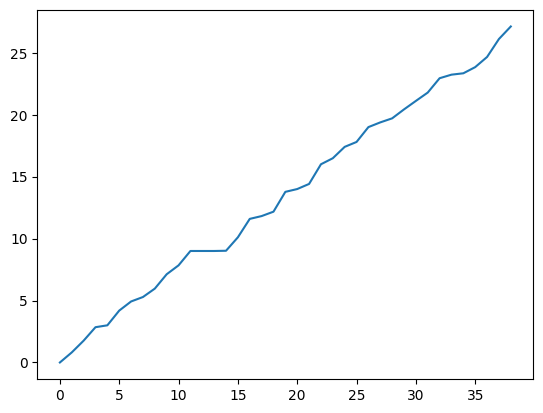

In [40]:
plt.plot(sorted(eig))

$\mathbf L_1$

In [41]:
L1 = boundaries_L[0].T@boundaries_L[0] + boundaries_L[1]@boundaries_L[1].T

In [92]:
eig, eigenvec = np.linalg.eig(L1)

$\beta_1$

In [93]:
np.isclose(np.zeros_like(eig), eig).sum()

6

/home/xenos/maga/venv/lib/python3.11/site-packages/matplotlib/cbook.py:1699: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
/home/xenos/maga/venv/lib/python3.11/site-packages/matplotlib/cbook.py:1345: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


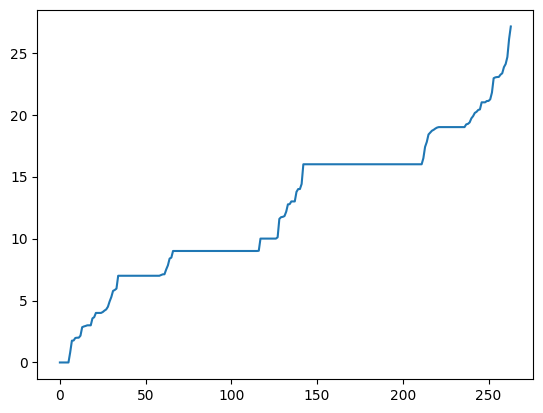

In [94]:
plt.plot(sorted(eig))

In [65]:
cmplx = SimplicialComplex()

for i in simplices_L:
    cmplx.add(i)

In [90]:
X = np.random.rand(64, 2) * 10

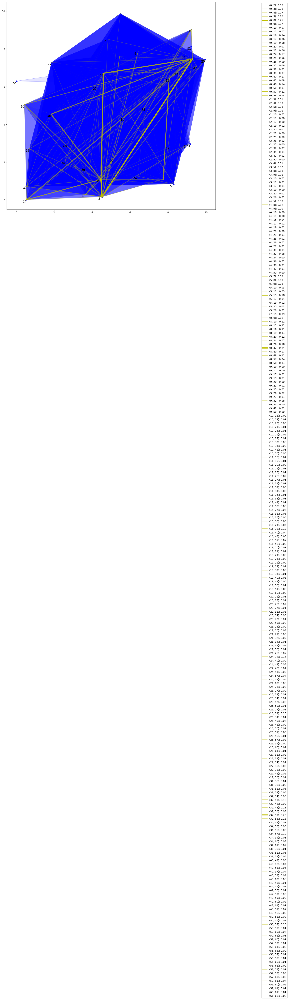

In [112]:
plot_harmonic_representative(0)

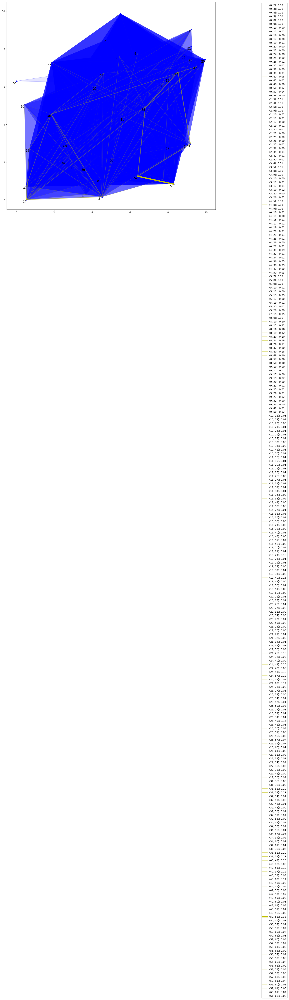

In [113]:
plot_harmonic_representative(2)

Construct boundaries for K

In [114]:
boundaries_K, simpl_K = create_boundary_matrices(simplices_K)

$\mathbf L_0$

In [133]:
L0 = boundaries_K[0]@boundaries_K[0].T

In [116]:
eig = np.linalg.eigvals(L0)

$ \beta_0 $

In [117]:
np.isclose(np.zeros_like(eig), eig).sum()

1

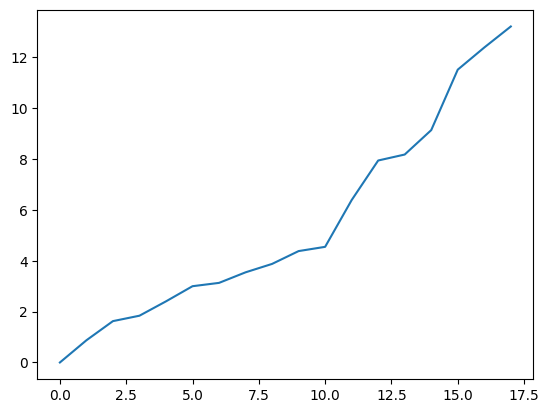

In [118]:
plt.plot(sorted(eig))

$\mathbf L_1$

In [119]:
L1 = boundaries_K[0].T@boundaries_K[0] + boundaries_K[1]@boundaries_K[1].T

In [123]:
eig, eigenvec = np.linalg.eig(L1)

$\beta_1$

In [124]:
np.isclose(np.zeros_like(eig), eig).sum()

6

/home/xenos/maga/venv/lib/python3.11/site-packages/matplotlib/cbook.py:1699: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
/home/xenos/maga/venv/lib/python3.11/site-packages/matplotlib/cbook.py:1345: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


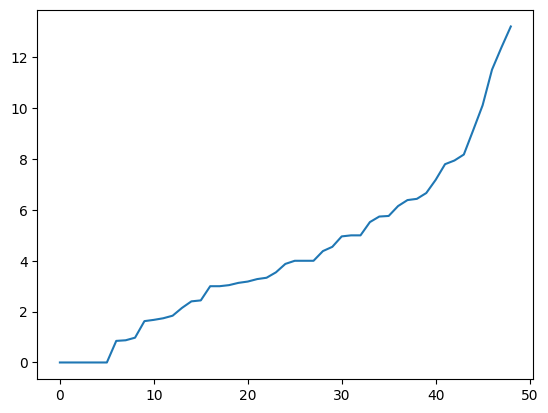

In [125]:
plt.plot(sorted(eig))

In [126]:
cmplx = SimplicialComplex()

for i in simplices_K:
    cmplx.add(i)

In [128]:
X = np.random.rand(21, 2) * 10

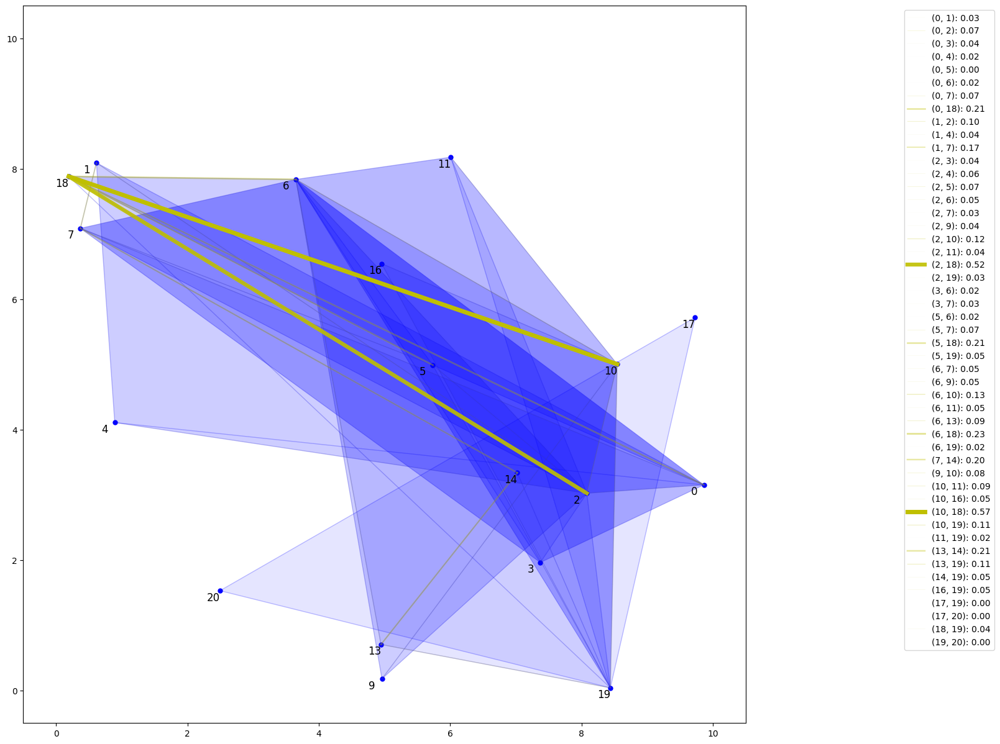

In [129]:
plot_harmonic_representative(0)

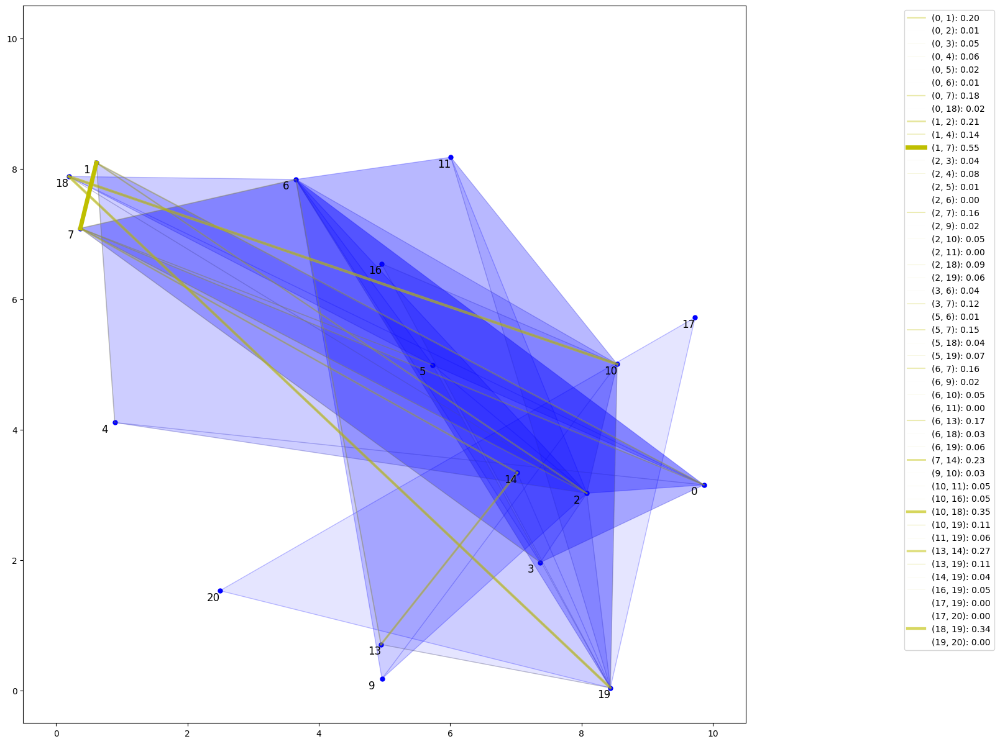

In [131]:
plot_harmonic_representative(2)

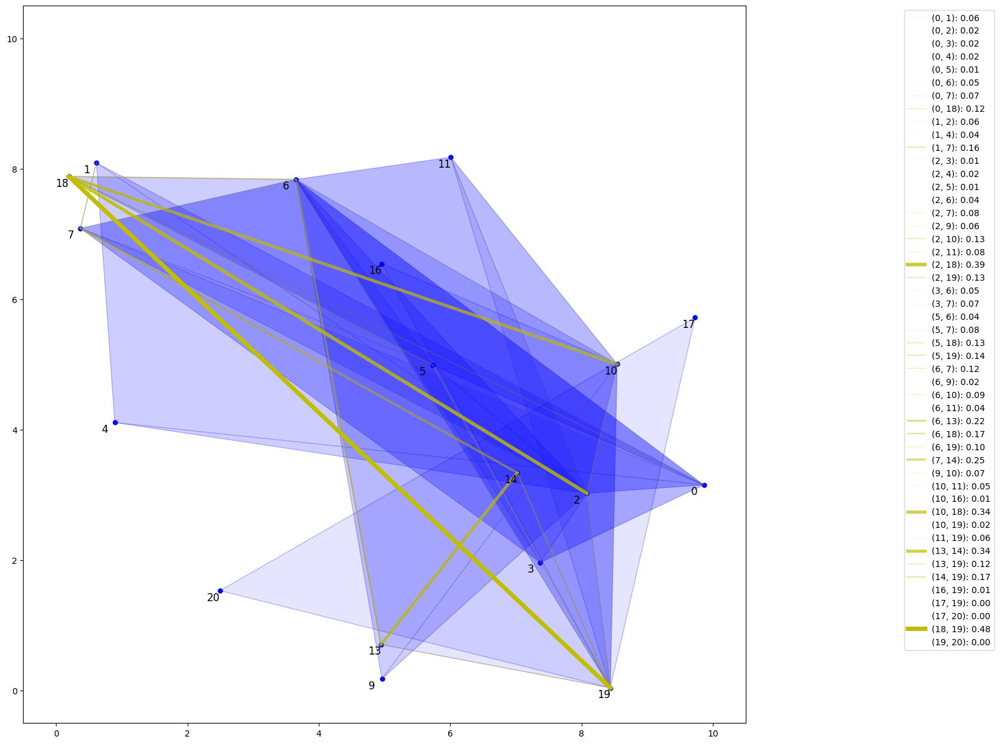

In [132]:
plot_harmonic_representative(5)

### Task 3

#### Simplicial network science

Consider the functional connectome dataset, consisting of Alzheimer decease-affected persons and control group matrices of Pearson's correlation coefficient.

**(1 point)** Compute the $k$-th Betti number curves of dimensions $0$ and $1$. Compute mean simplicial degrees and centralities curves introduces on Lecture 8 using the `simplicialx` library. For each patient groups, plot the means of obtained curves along with their confidence intervals.

**(1 point)** For each of obtained curves, along with their union, solve the binary classification problem with 5-fold cross validation using classifiers from:
- `sklearn` library,
- 1D CNN or MLP-Mixer model, https://arxiv.org/abs/2105.01601.

In [5]:
import seaborn as sns
import pickle
import numpy as np
import multiprocessing

In [8]:
X = np.load("./data/X_OASIS3_MSDL_pearson-r.npy")
y = np.load("./data/y_OASIS3.npy") # 0 - controls, 1 - Alzheimer decease-affected
X.shape, y.shape

((1029, 39, 39), (1029,))

Firstly we need to define a transformation of correlation matrix into some proper distance matrix in metric space. Although it's not a trivial question and we could use some kernel here too -- the most common solution is to use the following transformation:

$M_{ij} = 1 - |C_{ij}|$

In [7]:
np.unique(y)

array([0, 1])

<Axes: ylabel='Count'>

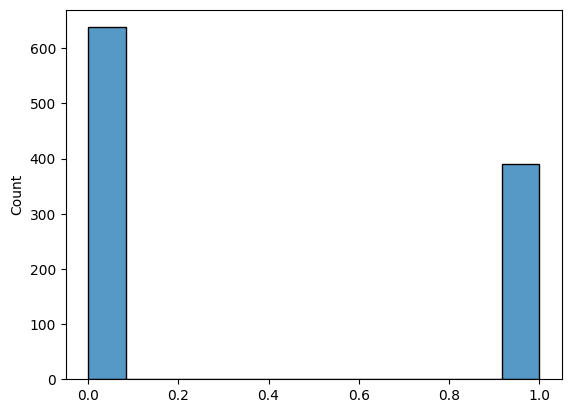

In [8]:
sns.histplot(y)

Example

<Axes: >

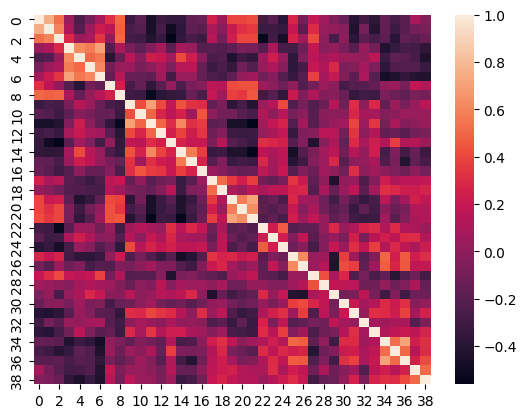

In [9]:
sns.heatmap(X[0])

In [9]:
transform = np.frompyfunc(lambda x: 1 - x, nin=1, nout=1,)

In [10]:
D = transform(X,).astype(np.float16)

In [11]:
np.max(D)

1.913

In [12]:
filtration = np.linspace(0, np.max(D), 30)

In [13]:
filtration

array([0.   , 0.066, 0.132, 0.198, 0.264, 0.33 , 0.396, 0.462, 0.528, 0.594, 0.66 , 0.726, 0.792,
       0.858, 0.924, 0.99 , 1.055, 1.121, 1.187, 1.253, 1.319, 1.385, 1.451, 1.517, 1.583, 1.649,
       1.715, 1.781, 1.847, 1.913])

In [10]:
def compute_betti(cmplx: SimplicialComplex, betti_dict: dict, k: int):
    '''
    cmplx: Simplicial Complex
    betti_dict: dictionary to add to
    k: order of highest betti number to compute
    '''

    for j in range(k+1):
            try:
                betti = cmplx.betti_number(j)
            except ValueError:
                betti = 0
            betti_dict[j].append(betti)

    return betti_dict

In [9]:
class TDAFeatures:
    def __init__(self):
        self.betti = defaultdict(list)
        self.degree: list = []
        self.degree2: list = []
        self.adjacency: list = []
        self.closeness_centrality: list = []
        self.betweenness_centrality: list = []
    
    def _check_dict(self, dict_values):

        if bool(dict_values):
            return [*dict_values]
        return [0]

    def try_add(self, fn, **kwargs):

        try:
            res = fn(**kwargs)
        except ValueError:
            return 0
        return res

    def update_tda_feats(self, cmplx):
    
        self.betti = compute_betti(cmplx, self.betti, k=1) # get zero and first betti
        self.degree.append(np.mean(cmplx.simplex_degree(k=1, p=1))) # mean edge-node simplex incidence
        try:
            self.degree2.append(np.mean(cmplx.simplex_degree(k=2, p=1))) # mean triangle-node incidence
            self.adjacency.append(np.mean(cmplx.simplex_adjacency_n(k=2, p=1))) # mean triangle-node adjacency
        except ValueError:
            self.degree2.append(0)
            self.adjacency.append(0)
            
        self.closeness_centrality.append(np.mean(
            self._check_dict(
                cmplx.simplex_closeness_centrality(p=1, q=0).values()
            ))) # edge-node close centrality
        self.betweenness_centrality.append(np.mean(
            self._check_dict(
                cmplx.simplex_betweenness_centrality(p=1, q=0).values()
            ))) # edge-node between centrality

    def update_to_last(self):

        for b in self.betti:
            self.betti[b] += [self.betti[b][-1]]
        self.degree += [self.degree[-1]]
        self.degree2 += [self.degree2[-1]]
        self.adjacency += [self.adjacency[-1]]
        self.closeness_centrality += [self.closeness_centrality[-1]]
        self.betweenness_centrality += [self.betweenness_centrality[-1]]

In [17]:
cmplx = SimplicialComplex()
tda_feats = TDAFeatures()

for i in range(D[0].shape[0]):
    cmplx.add([i])

tda_feats.update_tda_feats(cmplx)

However, current implementation takes too long to process -- especially taking the dataset size into account

In [18]:
for i in tqdm(filtration[1:]):
    cur = (D[0] <= i)*D[0]
    tmp = cmplx.from_graph(cur)
    if len(tmp.simplices) == len(cmplx.simplices):
        if all([np.array_equal(a, b) for a,b in zip(tmp.simplices, cmplx.simplices)]):
            cmplx = tmp
            tda_feats.update_to_last()
            continue
    cmplx = tmp
    tda_feats.update_tda_feats(cmplx=cmplx)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 29/29 [03:25<00:00,  7.07s/it]


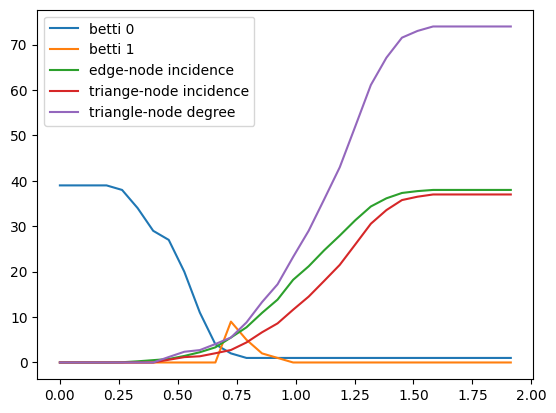

In [19]:
plt.plot(filtration, tda_feats.betti[0], label="betti 0")
plt.plot(filtration, tda_feats.betti[1], label="betti 1")
plt.plot(filtration, tda_feats.degree, label="edge-node incidence") # actually the same as degree for nodes and edges
plt.plot(filtration, tda_feats.degree2, label="triange-node incidence")
plt.plot(filtration, tda_feats.adjacency, label="triangle-node degree")
plt.legend()

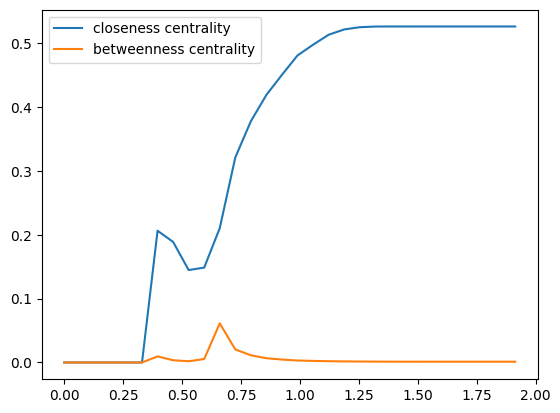

In [21]:
plt.plot(filtration, tda_feats.closeness_centrality, label="closeness centrality")
plt.plot(filtration, tda_feats.betweenness_centrality, label="betweenness centrality")
plt.legend()

In [11]:
def process_dataset(dataset, filtration):

    stats = []

    for participant in tqdm(dataset):
    
        cmplx = SimplicialComplex()
        tda_feats = TDAFeatures()
        
        for i in range(participant.shape[0]):
            cmplx.add([i])
        
        tda_feats.update_tda_feats(cmplx)
        
        for i in filtration[1:]:
            cur = (participant <= i)*participant
            tmp = cmplx.from_graph(cur)
            if len(tmp.simplices) == len(cmplx.simplices):
                if all([np.array_equal(a, b) for a,b in zip(tmp.simplices, cmplx.simplices)]):
                    cmplx = tmp
                    tda_feats.update_to_last()
                    continue
            cmplx = tmp
            tda_feats.update_tda_feats(cmplx=cmplx)

        stats.append(tda_feats)
    return stats

In [38]:
splitted_D = np.array_split(D, 10)

In [39]:
with multiprocessing.Pool(processes=10) as exec:
    stats = list(exec.starmap(process_dataset, zip(splitted_D, [filtration]*10)))

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 103/103 [7:18:46<00:00, 255.60s/it]


In [ ]:
stats = list(chain.from_iterable(stats))

In [46]:
with open("stats.pkl", "wb") as f:
    pickle.dump(stats, f)

In [12]:
with open("stats.pkl", "rb") as f:
    stats = pickle.load(f)

In [13]:
indices = [np.argwhere(y==index) for index in np.unique(y)]

In [14]:
group0 = np.array(stats)[indices[0]].squeeze()
group1 = np.array(stats)[indices[1]].squeeze()

In [15]:
@dataclass
class TdaStats:

    betti0_mean: np.array
    betti0_ci: np.array
    betti1_mean: np.array
    betti1_ci: np.array
    degree_mean: np.array
    degree_ci: np.array
    degree2_mean: np.array
    degree2_ci: np.array
    adjacency_mean: np.array
    adjacency_ci: np.array
    closeness_mean: np.array
    closeness_ci: np.array
    betweenness_mean: np.array
    betweenness_ci: np.array
    

In [16]:
def compute_stats(feats: list) -> TdaStats:
    
    betti_0 = np.array([feat.betti[0] for feat in feats])
    betti_1 = np.array([feat.betti[1] for feat in feats])
    degree = np.array([feat.degree for feat in feats])
    degree2 = np.array([feat.degree2 for feat in feats])
    adjacency = np.array([feat.adjacency for feat in feats])
    closeness = np.array([feat.closeness_centrality for feat in feats])
    betweenness = np.array([feat.betweenness_centrality for feat in feats])

    return TdaStats(betti0_mean=np.mean(betti_0, axis=0),
                    betti0_ci=scipy.stats.bootstrap((betti_0, ), statistic=np.mean, axis=0).confidence_interval,
                    betti1_mean=np.mean(betti_1, axis=0),
                    betti1_ci=scipy.stats.bootstrap((betti_1, ), statistic=np.mean, axis=0).confidence_interval,
                    degree_mean=np.mean(degree, axis=0),
                    degree_ci=scipy.stats.bootstrap((degree, ), statistic=np.mean, axis=0).confidence_interval,
                    degree2_mean=np.mean(degree2, axis=0),
                    degree2_ci=scipy.stats.bootstrap((degree2, ), statistic=np.mean, axis=0).confidence_interval,
                    adjacency_mean=np.mean(adjacency, axis=0),
                    adjacency_ci=scipy.stats.bootstrap((adjacency, ), statistic=np.mean, axis=0).confidence_interval,
                    closeness_mean=np.mean(closeness, axis=0),
                    closeness_ci=scipy.stats.bootstrap((closeness, ), statistic=np.mean, axis=0).confidence_interval,
                    betweenness_mean=np.mean(betweenness, axis=0),
                    betweenness_ci=scipy.stats.bootstrap((betweenness, ), statistic=np.mean, axis=0).confidence_interval,
                   )
                    

In [17]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    group0_stats = compute_stats(group0)
    group1_stats = compute_stats(group1)

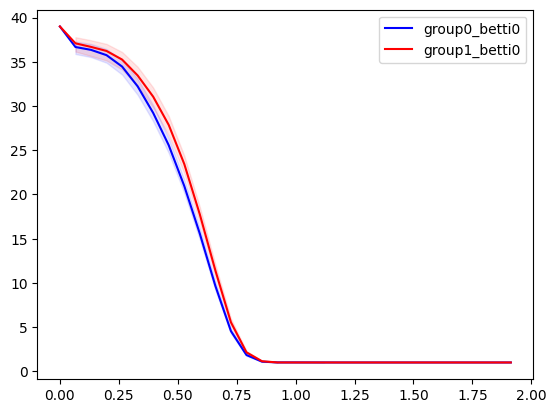

In [55]:
# betti0

plt.plot(filtration, group0_stats.betti0_mean, c="b", label="group0_betti0")
plt.fill_between(filtration, group0_stats.betti0_ci.low, group0_stats.betti0_ci.high, color="b", alpha=.1)

plt.plot(filtration, group1_stats.betti0_mean, c="r", label="group1_betti0")
plt.fill_between(filtration, group1_stats.betti0_ci.low, group1_stats.betti0_ci.high, color="r", alpha=.1)
plt.legend()


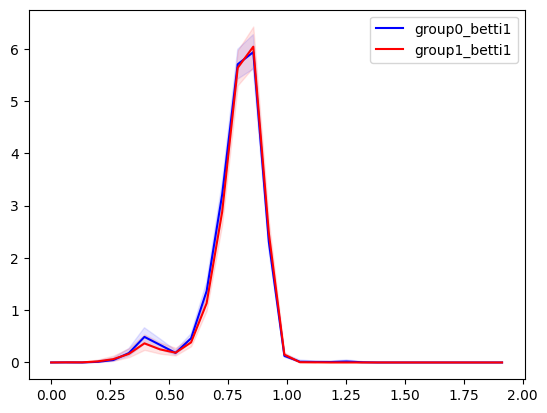

In [56]:
# betti1

plt.plot(filtration, group0_stats.betti1_mean, c="b", label="group0_betti1")
plt.fill_between(filtration, group0_stats.betti1_ci.low, group0_stats.betti1_ci.high, color="b", alpha=.1)

plt.plot(filtration, group1_stats.betti1_mean, c="r", label="group1_betti1")
plt.fill_between(filtration, group1_stats.betti1_ci.low, group1_stats.betti1_ci.high, color="r", alpha=.1)
plt.legend()


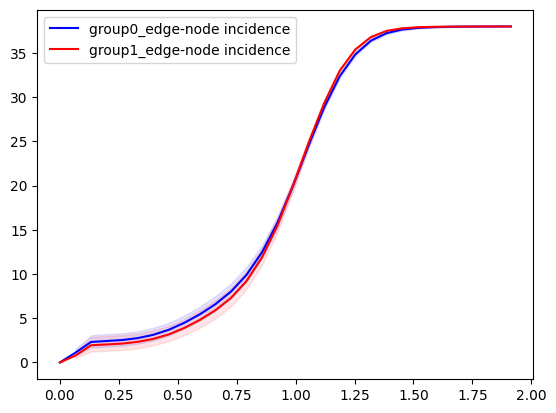

In [139]:
# edge-node incidence

plt.plot(filtration, group0_stats.degree_mean, c="b", label="group0_edge-node incidence")
plt.fill_between(filtration, group0_stats.degree_ci.low, group0_stats.degree_ci.high, color="b", alpha=.1)

plt.plot(filtration, group1_stats.degree_mean, c="r", label="group1_edge-node incidence")
plt.fill_between(filtration, group1_stats.degree_ci.low, group1_stats.degree_ci.high, color="r", alpha=.1)
plt.legend()


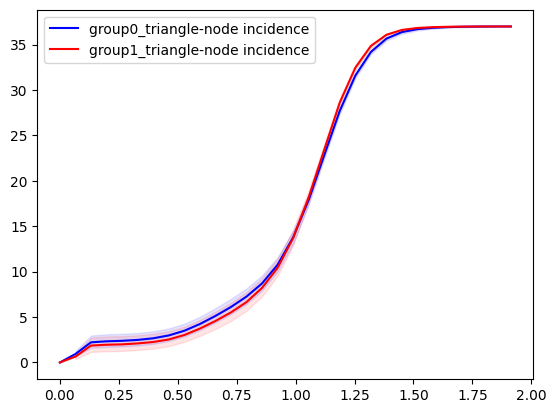

In [137]:
# triangle-node incidence

plt.plot(filtration, group0_stats.degree2_mean, c="b", label="group0_triangle-node incidence")
plt.fill_between(filtration, group0_stats.degree2_ci.low, group0_stats.degree2_ci.high, color="b", alpha=.1)

plt.plot(filtration, group1_stats.degree2_mean, c="r", label="group1_triangle-node incidence")
plt.fill_between(filtration, group1_stats.degree2_ci.low, group1_stats.degree2_ci.high, color="r", alpha=.1)
plt.legend()


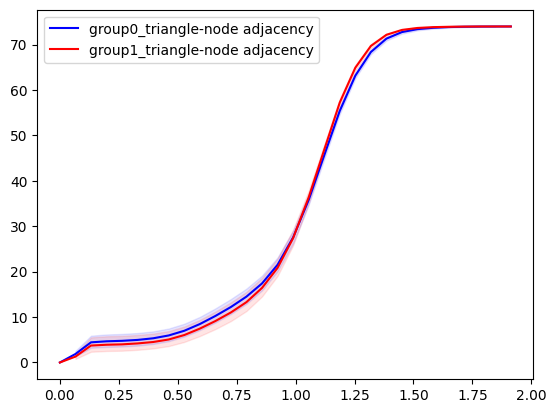

In [138]:
# triangle-node adjacency

plt.plot(filtration, group0_stats.adjacency_mean, c="b", label="group0_triangle-node adjacency")
plt.fill_between(filtration, group0_stats.adjacency_ci.low, group0_stats.adjacency_ci.high, color="b", alpha=.1)

plt.plot(filtration, group1_stats.adjacency_mean, c="r", label="group1_triangle-node adjacency")
plt.fill_between(filtration, group1_stats.adjacency_ci.low, group1_stats.adjacency_ci.high, color="r", alpha=.1)
plt.legend()


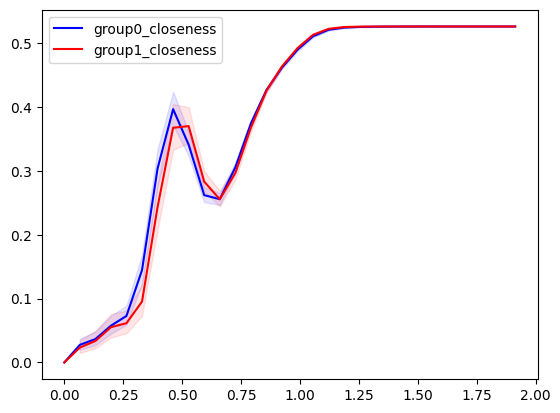

In [60]:
# closeness_centrality

plt.plot(filtration, group0_stats.closeness_mean, c="b", label="group0_closeness")
plt.fill_between(filtration, group0_stats.closeness_ci.low, group0_stats.closeness_ci.high, color="b", alpha=.1)

plt.plot(filtration, group1_stats.closeness_mean, c="r", label="group1_closeness")
plt.fill_between(filtration, group1_stats.closeness_ci.low, group1_stats.closeness_ci.high, color="r", alpha=.1)
plt.legend()


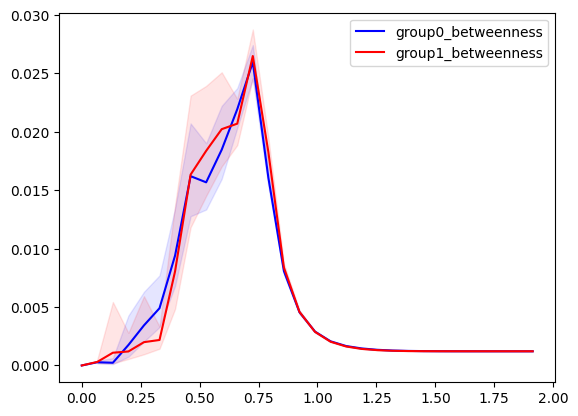

In [62]:
# betweenness

plt.plot(filtration, group0_stats.betweenness_mean, c="b", label="group0_betweenness")
plt.fill_between(filtration, group0_stats.betweenness_ci.low, group0_stats.betweenness_ci.high, color="b", alpha=.1)

plt.plot(filtration, group1_stats.betweenness_mean, c="r", label="group1_betweenness")
plt.fill_between(filtration, group1_stats.betweenness_ci.low, group1_stats.betweenness_ci.high, color="r", alpha=.1)
plt.legend()


Различия в средних почти нет -- задачка весьма нетривиальная

### Classification task

In [6]:
import einops
import torch
from torch import nn
from functools import partial
from einops.layers.torch import Rearrange, Reduce, EinMix
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, f1_score
import operator
from tqdm import tqdm, trange
from torchsummary import torchsummary
from sklearn.model_selection import StratifiedKFold

In [141]:
def score_sklearn_model(model, data, y, splits: int):

    y_preds = []
    y_true = []
    
    kfold = StratifiedKFold(n_splits=splits)

    for train, test in kfold.split(data, y, ):

        train_x, train_y = list(zip(*operator.itemgetter(*train)(data)))
        test_x, test_y = list(zip(*operator.itemgetter(*test)(data)))

        train_x = [X.flatten() for X in train_x]
        test_x = [X.flatten() for X in test_x]

        model.fit(train_x, train_y)

        pred = model.predict(test_x)

        y_preds.extend(pred)
        y_true.extend(test_y)

    print("F1-score: ", f1_score(y_true, y_preds))
    print("--------")
    print(classification_report(y_true, y_preds))
    
    return None

In [162]:
data = list(zip([np.array([item.betti[0],
                item.betti[1],
                item.degree,
                item.degree2,
                item.adjacency,
                item.closeness_centrality,
                item.betweenness_centrality]) for item in stats], y))

In [115]:
data_betti0 = list(zip([np.array([
                item.betti[0],
                        ]) for item in stats], y))

In [116]:
data_betti1 = list(zip([np.array([
                item.betti[1],
                        ]) for item in stats], y))

In [117]:
data_degree1 = list(zip([np.array([
                item.degree,
                          ]) for item in stats], y))

In [118]:
data_degree2 = list(zip([np.array([
                item.degree2,
                          ]) for item in stats], y))

In [119]:
data_adjacency = list(zip([np.array([
                item.adjacency,
                          ]) for item in stats], y))

In [120]:
data_closeness = list(zip([np.array([
                item.closeness_centrality,
                          ]) for item in stats], y))

In [121]:
data_betweenness = list(zip([np.array([
                item.betweenness_centrality
                          ]) for item in stats], y))

In [163]:
characteristics = {"betti0": data_betti0,
                  "betti1": data_betti1,
                  "node-edge incidence": data_degree1,
                  "node-triangle incidence": data_degree2,
                  "node-triangle adjacency": data_adjacency,
                  "closeness centrality": data_closeness,
                  "betweenness centrality": data_betweenness,
                  "all curves": data}

### Now let's iteratively score different characteristics

In [122]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
import lightgbm

In [165]:
model = DecisionTreeClassifier()

In [166]:
for k, v in characteristics.items():
    print(k)
    score_sklearn_model(model, v, y, splits=5)
    print("________________________")
    print()

betti0
F1-score:  0.40789473684210525
--------
              precision    recall  f1-score   support

           0       0.64      0.66      0.65       638
           1       0.42      0.40      0.41       391

    accuracy                           0.56      1029
   macro avg       0.53      0.53      0.53      1029
weighted avg       0.56      0.56      0.56      1029

________________________

betti1
F1-score:  0.3737113402061855
--------
              precision    recall  f1-score   support

           0       0.62      0.62      0.62       638
           1       0.38      0.37      0.37       391

    accuracy                           0.53      1029
   macro avg       0.50      0.50      0.50      1029
weighted avg       0.53      0.53      0.53      1029

________________________

node-edge incidence
F1-score:  0.44387755102040816
--------
              precision    recall  f1-score   support

           0       0.66      0.66      0.66       638
           1       0.44      0.4

In [167]:
model = RandomForestClassifier()

In [168]:
for k, v in characteristics.items():
    print(k)
    score_sklearn_model(model, v, y, splits=5)
    print("________________________")
    print()

betti0
F1-score:  0.3486529318541997
--------
              precision    recall  f1-score   support

           0       0.64      0.80      0.71       638
           1       0.46      0.28      0.35       391

    accuracy                           0.60      1029
   macro avg       0.55      0.54      0.53      1029
weighted avg       0.57      0.60      0.57      1029

________________________

betti1
F1-score:  0.29153605015673983
--------
              precision    recall  f1-score   support

           0       0.62      0.76      0.68       638
           1       0.38      0.24      0.29       391

    accuracy                           0.56      1029
   macro avg       0.50      0.50      0.49      1029
weighted avg       0.53      0.56      0.53      1029

________________________

node-edge incidence
F1-score:  0.37658227848101267
--------
              precision    recall  f1-score   support

           0       0.65      0.81      0.72       638
           1       0.49      0.3

In [169]:
model = lightgbm.LGBMClassifier(
    verbose=-1,
)

In [170]:
for k, v in characteristics.items():
    print(k)
    score_sklearn_model(model, v, y, splits=5)
    print("________________________")
    print()

betti0
F1-score:  0.4081041968162084
--------
              precision    recall  f1-score   support

           0       0.66      0.75      0.70       638
           1       0.47      0.36      0.41       391

    accuracy                           0.60      1029
   macro avg       0.56      0.56      0.55      1029
weighted avg       0.59      0.60      0.59      1029

________________________

betti1
F1-score:  0.302496328928047
--------
              precision    recall  f1-score   support

           0       0.61      0.71      0.66       638
           1       0.36      0.26      0.30       391

    accuracy                           0.54      1029
   macro avg       0.48      0.49      0.48      1029
weighted avg       0.51      0.54      0.52      1029

________________________

node-edge incidence
F1-score:  0.40465793304221254
--------
              precision    recall  f1-score   support

           0       0.66      0.75      0.70       638
           1       0.47      0.36 

### Scoring DL model

In [7]:
def universal_predict(model, x):
    x_packed, ps = pack([x], '* t c')
    predictions_packed = model(x_packed)
    [predictions] = unpack(predictions_packed, ps, '* cls')
    return predictions

In [8]:
class PreNormResidual(nn.Module):
    def __init__(self, dim, fn):
        super().__init__()
        self.fn = fn
        self.norm = nn.LayerNorm(dim)

    def forward(self, x):
        return self.fn(self.norm(x)) + x

def TokenMixer(dim, expansion_factor: int , dropout: float):
    inner_dim = int(dim * expansion_factor)
    return nn.Sequential(
        EinMix('b hw c -> b hw c_hid', weight_shape='c c_hid', bias_shape='c_hid',
           c=dim, c_hid=inner_dim),
        nn.GELU(),
        nn.Dropout(dropout),
        EinMix('b hw c_hid -> b hw c', weight_shape='c_hid c', bias_shape='c',
           c=dim, c_hid=inner_dim),
        nn.Dropout(dropout)
    )

def ChannelMixer(dim, expansion_factor: int, dropout: float):
    n_hidden = int(dim * expansion_factor)
    return nn.Sequential(
        EinMix('b hw c -> b hid c', weight_shape='hw hid', bias_shape='hid', 
            hw=dim, hid=n_hidden),
        nn.GELU(),
        nn.Dropout(dropout),
        EinMix('b hid c -> b hw c', weight_shape='hid hw', bias_shape='hw',  
            hw=dim, hid=n_hidden),
        nn.Dropout(dropout),
    )

def MLPMixer(*, channels, tokens, depth, num_classes, 
             expansion_factor_channel = 4, 
             expansion_factor_token = 0.5, 
             dropout = 0.):
    
    return nn.Sequential(
        Rearrange('b c t -> b t c'),
        *[nn.Sequential(
            PreNormResidual(channels, ChannelMixer(tokens, expansion_factor_channel, dropout, )),
            PreNormResidual(channels, TokenMixer(channels, expansion_factor_token, dropout, ))
        ) for _ in range(depth)],
        nn.LayerNorm(channels),
        Reduce('b t c -> b c', 'mean'),
        nn.Linear(channels, num_classes)
    )

In [375]:
def score_pytorch_model(model_class, data, y, splits: int, n_epochs: int, *args, **kwargs):

    y_preds = []
    y_true = []
    
    kfold = StratifiedKFold(n_splits=splits)

    for train, test in kfold.split(data, y, ):

        train = operator.itemgetter(*train)(data)
        test = operator.itemgetter(*test)(data)

        dl = torch.utils.data.DataLoader(train, batch_size=96, shuffle=True, drop_last=True, )
        eval_dl = torch.utils.data.DataLoader(test, batch_size=5, shuffle=False, drop_last=True, )

        model_kwargs = kwargs.get("model_kwargs", {"channels": 7,
                                                 "tokens": 30,
                                                 "depth": 2,
                                                 "num_classes": 2,
                                                 "expansion_factor_channel": 2,
                                                 "expansion_factor_token": .25,
                                                 "dropout": .3})
                                            
        model = model_class(**model_kwargs)

        optimizer = torch.optim.Adam(model.parameters(), lr=3e-3)
        lr_scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, len(dl))
        
        criteria = torch.nn.CrossEntropyLoss()
        
        model = model.to("cpu")
        model.train();


        tq_epoch = trange(n_epochs, desc='Epochs: ',)

        for epoch in tq_epoch:
        
            losses = []
            
            for batch in dl:
                
                res = model(batch[0].to(torch.float32))
                
                loss = criteria(input=res, target=batch[1])
                losses.append(loss.detach().item())
        
                loss.backward()
                optimizer.step()
                lr_scheduler.step()
                optimizer.zero_grad()

            tq_epoch.set_postfix({
                    'Avg epoch loss': np.mean(losses),
            })

        model.eval();
        for batch in eval_dl:
            with torch.no_grad():        
        
                y_preds.extend(torch.argmax(model(batch[0].to(torch.float32)), axis=1).tolist())
                y_true.extend(batch[1].tolist())

    
    print("F1-score: ", f1_score(y_true, y_preds, zero_division=0.0))
    print("--------")
    print(classification_report(y_true, y_preds, zero_division=0.0))
    
    return None

In [206]:
N_EPOCHS=40

In [9]:
class  Conv_net(nn.Module):

    def __init__(self, classes: int, channels: int, lin_dim: int, conv_dim: int, dropout: int):
        super().__init__()

        self.model = nn.Sequential(
            nn.Conv1d(channels, conv_dim, kernel_size=3, stride=1, padding=1),
            nn.MaxPool1d(2),
            nn.Dropout1d(dropout),
            nn.ReLU(),

            nn.Conv1d(conv_dim, conv_dim*3, kernel_size=5, stride=2, padding=1),
            nn.MaxPool1d(2),
            nn.Dropout1d(dropout),
            nn.ReLU(),

            Rearrange("b c t -> b (c t)"),

            nn.LazyLinear(lin_dim),
            nn.LeakyReLU(inplace=True),
            nn.Linear(lin_dim, classes), 
        )


    def forward(self, x):
        return self.model(x)

In [547]:
model_kwargs_conv = {
    "channels": 7, 
    "classes": 2,
    "lin_dim": 64,
    "conv_dim": 32,
    "dropout": .3
}

In [542]:
model = Conv_net(**model_kwargs_conv)

/home/xenos/Documents/masters/venv/lib/python3.11/site-packages/torch/nn/modules/lazy.py:180: UserWarning: Lazy modules are a new feature under heavy development so changes to the API or functionality can happen at any moment.
  warnings.warn('Lazy modules are a new feature under heavy development '


In [543]:
torchsummary.summary(model, (7, 30))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv1d-1               [-1, 32, 30]             704
         MaxPool1d-2               [-1, 32, 15]               0
         Dropout1d-3               [-1, 32, 15]               0
              ReLU-4               [-1, 32, 15]               0
            Conv1d-5                [-1, 96, 7]          15,456
         MaxPool1d-6                [-1, 96, 3]               0
         Dropout1d-7                [-1, 96, 3]               0
              ReLU-8                [-1, 96, 3]               0
         Rearrange-9                  [-1, 288]               0
           Linear-10                   [-1, 64]          18,496
        LeakyReLU-11                   [-1, 64]               0
           Linear-12                    [-1, 2]             130
Total params: 34,786
Trainable params: 34,786
Non-trainable params: 0
---------------------------------

In [548]:
for k, v in characteristics.items():
    print(k)
    if k == "all curves":
        model_kwargs_conv["channels"] = 7
    else:
        model_kwargs_conv["channels"] = 1
    score_pytorch_model(Conv_net, v, y, splits=5, n_epochs=N_EPOCHS, 
                        model_kwargs=model_kwargs_conv)
    print("________________________")
    print()

/home/xenos/Documents/masters/venv/lib/python3.11/site-packages/torch/nn/modules/lazy.py:180: UserWarning: Lazy modules are a new feature under heavy development so changes to the API or functionality can happen at any moment.
  warnings.warn('Lazy modules are a new feature under heavy development '


betti0


Epochs: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 30.80it/s, Avg epoch loss=0.652]
/home/xenos/Documents/masters/venv/lib/python3.11/site-packages/torch/nn/modules/lazy.py:180: UserWarning: Lazy modules are a new feature under heavy development so changes to the API or functionality can happen at any moment.
  warnings.warn('Lazy modules are a new feature under heavy development '


F1-score:  0.09905660377358491
--------
              precision    recall  f1-score   support

           0       0.63      0.97      0.77       638
           1       0.57      0.05      0.10       387

    accuracy                           0.63      1025
   macro avg       0.60      0.51      0.43      1025
weighted avg       0.61      0.63      0.51      1025

________________________

betti1


Epochs: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 29.62it/s, Avg epoch loss=0.648]
/home/xenos/Documents/masters/venv/lib/python3.11/site-packages/torch/nn/modules/lazy.py:180: UserWarning: Lazy modules are a new feature under heavy development so changes to the API or functionality can happen at any moment.
  warnings.warn('Lazy modules are a new feature under heavy development '


F1-score:  0.024509803921568627
--------
              precision    recall  f1-score   support

           0       0.62      0.97      0.76       638
           1       0.24      0.01      0.02       387

    accuracy                           0.61      1025
   macro avg       0.43      0.49      0.39      1025
weighted avg       0.48      0.61      0.48      1025

________________________

node-edge incidence


Epochs: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 31.73it/s, Avg epoch loss=0.653]
/home/xenos/Documents/masters/venv/lib/python3.11/site-packages/torch/nn/modules/lazy.py:180: UserWarning: Lazy modules are a new feature under heavy development so changes to the API or functionality can happen at any moment.
  warnings.warn('Lazy modules are a new feature under heavy development '


F1-score:  0.19665271966527195
--------
              precision    recall  f1-score   support

           0       0.64      0.93      0.76       638
           1       0.52      0.12      0.20       387

    accuracy                           0.63      1025
   macro avg       0.58      0.53      0.48      1025
weighted avg       0.59      0.63      0.54      1025

________________________

node-triangle incidence


Epochs: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 30.82it/s, Avg epoch loss=0.661]
/home/xenos/Documents/masters/venv/lib/python3.11/site-packages/torch/nn/modules/lazy.py:180: UserWarning: Lazy modules are a new feature under heavy development so changes to the API or functionality can happen at any moment.
  warnings.warn('Lazy modules are a new feature under heavy development '


F1-score:  0.0
--------
              precision    recall  f1-score   support

           0       0.62      1.00      0.77       638
           1       0.00      0.00      0.00       387

    accuracy                           0.62      1025
   macro avg       0.31      0.50      0.38      1025
weighted avg       0.39      0.62      0.48      1025

________________________

node-triangle adjacency


Epochs: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 29.57it/s, Avg epoch loss=0.667]
/home/xenos/Documents/masters/venv/lib/python3.11/site-packages/torch/nn/modules/lazy.py:180: UserWarning: Lazy modules are a new feature under heavy development so changes to the API or functionality can happen at any moment.
  warnings.warn('Lazy modules are a new feature under heavy development '


F1-score:  0.05853658536585367
--------
              precision    recall  f1-score   support

           0       0.63      0.98      0.76       638
           1       0.52      0.03      0.06       387

    accuracy                           0.62      1025
   macro avg       0.57      0.51      0.41      1025
weighted avg       0.59      0.62      0.50      1025

________________________

closeness centrality


Epochs: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 31.59it/s, Avg epoch loss=0.649]
/home/xenos/Documents/masters/venv/lib/python3.11/site-packages/torch/nn/modules/lazy.py:180: UserWarning: Lazy modules are a new feature under heavy development so changes to the API or functionality can happen at any moment.
  warnings.warn('Lazy modules are a new feature under heavy development '


F1-score:  0.14861995753715498
--------
              precision    recall  f1-score   support

           0       0.63      0.92      0.75       638
           1       0.42      0.09      0.15       387

    accuracy                           0.61      1025
   macro avg       0.52      0.51      0.45      1025
weighted avg       0.55      0.61      0.52      1025

________________________

betweenness centrality


Epochs: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 28.77it/s, Avg epoch loss=0.663]
/home/xenos/Documents/masters/venv/lib/python3.11/site-packages/torch/nn/modules/lazy.py:180: UserWarning: Lazy modules are a new feature under heavy development so changes to the API or functionality can happen at any moment.
  warnings.warn('Lazy modules are a new feature under heavy development '


F1-score:  0.0
--------
              precision    recall  f1-score   support

           0       0.62      1.00      0.77       638
           1       0.00      0.00      0.00       387

    accuracy                           0.62      1025
   macro avg       0.31      0.50      0.38      1025
weighted avg       0.39      0.62      0.48      1025

________________________

all curves


Epochs: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:01<00:00, 29.67it/s, Avg epoch loss=0.64]


F1-score:  0.3577817531305903
--------
              precision    recall  f1-score   support

           0       0.66      0.89      0.76       638
           1       0.58      0.26      0.36       387

    accuracy                           0.65      1025
   macro avg       0.62      0.57      0.56      1025
weighted avg       0.63      0.65      0.61      1025

________________________



In [610]:
model_kwargs_mlp={"channels": 7,
             "tokens": 30,
             "depth": 2,
             "num_classes": 2,
             "expansion_factor_channel": 1.5,
             "expansion_factor_token": 3,
             "dropout": .3}

In [611]:
model = MLPMixer(**model_kwargs_mlp)

In [612]:
torchsummary.summary(model, (7, 30))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
         Rearrange-1                [-1, 30, 7]               0
         LayerNorm-2                [-1, 30, 7]              14
            EinMix-3                [-1, 45, 7]           1,395
              GELU-4                [-1, 45, 7]               0
           Dropout-5                [-1, 45, 7]               0
            EinMix-6                [-1, 30, 7]           1,380
           Dropout-7                [-1, 30, 7]               0
   PreNormResidual-8                [-1, 30, 7]               0
         LayerNorm-9                [-1, 30, 7]              14
           EinMix-10               [-1, 30, 21]             168
             GELU-11               [-1, 30, 21]               0
          Dropout-12               [-1, 30, 21]               0
           EinMix-13                [-1, 30, 7]             154
          Dropout-14                [-1

In [613]:
for k, v in characteristics.items():
    print(k)
    if k == "all curves":
        model_kwargs_mlp["channels"] = 7
    else:
        model_kwargs_mlp["channels"] = 1
    score_pytorch_model(MLPMixer, v, y, splits=5, n_epochs=N_EPOCHS, 
                        model_kwargs=model_kwargs_mlp)
    print("________________________")
    print()

betti0


Epochs: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 16.87it/s, Avg epoch loss=0.667]


F1-score:  0.0
--------
              precision    recall  f1-score   support

           0       0.62      1.00      0.77       638
           1       0.00      0.00      0.00       387

    accuracy                           0.62      1025
   macro avg       0.31      0.50      0.38      1025
weighted avg       0.39      0.62      0.48      1025

________________________

betti1


Epochs: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.99it/s, Avg epoch loss=0.666]


F1-score:  0.0
--------
              precision    recall  f1-score   support

           0       0.62      1.00      0.77       638
           1       0.00      0.00      0.00       387

    accuracy                           0.62      1025
   macro avg       0.31      0.50      0.38      1025
weighted avg       0.39      0.62      0.48      1025

________________________

node-edge incidence


Epochs: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 16.43it/s, Avg epoch loss=0.666]


F1-score:  0.0
--------
              precision    recall  f1-score   support

           0       0.62      1.00      0.77       638
           1       0.00      0.00      0.00       387

    accuracy                           0.62      1025
   macro avg       0.31      0.50      0.38      1025
weighted avg       0.39      0.62      0.48      1025

________________________

node-triangle incidence


Epochs: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 16.23it/s, Avg epoch loss=0.666]


F1-score:  0.0
--------
              precision    recall  f1-score   support

           0       0.62      1.00      0.77       638
           1       0.00      0.00      0.00       387

    accuracy                           0.62      1025
   macro avg       0.31      0.50      0.38      1025
weighted avg       0.39      0.62      0.48      1025

________________________

node-triangle adjacency


Epochs: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 16.03it/s, Avg epoch loss=0.665]


F1-score:  0.0
--------
              precision    recall  f1-score   support

           0       0.62      1.00      0.77       638
           1       0.00      0.00      0.00       387

    accuracy                           0.62      1025
   macro avg       0.31      0.50      0.38      1025
weighted avg       0.39      0.62      0.48      1025

________________________

closeness centrality


Epochs: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 16.02it/s, Avg epoch loss=0.663]


F1-score:  0.0
--------
              precision    recall  f1-score   support

           0       0.62      1.00      0.77       638
           1       0.00      0.00      0.00       387

    accuracy                           0.62      1025
   macro avg       0.31      0.50      0.38      1025
weighted avg       0.39      0.62      0.48      1025

________________________

betweenness centrality


Epochs: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 16.60it/s, Avg epoch loss=0.664]


F1-score:  0.0
--------
              precision    recall  f1-score   support

           0       0.62      1.00      0.77       638
           1       0.00      0.00      0.00       387

    accuracy                           0.62      1025
   macro avg       0.31      0.50      0.38      1025
weighted avg       0.39      0.62      0.48      1025

________________________

all curves


Epochs: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 13.39it/s, Avg epoch loss=0.655]


F1-score:  0.048426150121065374
--------
              precision    recall  f1-score   support

           0       0.62      0.97      0.76       638
           1       0.38      0.03      0.05       387

    accuracy                           0.62      1025
   macro avg       0.50      0.50      0.40      1025
weighted avg       0.53      0.62      0.49      1025

________________________



#### А вот MLPMixer справляется несколько хуже -- притом что в "одномерном" случае(что в общем-то ожидаемо), так и в "многомерном".

Можно было бы, конечно, воспринимать исходные матрицы $[1*30]$ и $[7*30]$ также как некоторые упорядоченные структуры и по аналогии с картинками делить их на локальные патчи, которые уже миксовать, но пока обойдемся реализацией через свертки.

### Task 4

#### Topological deep learning

**(1 point)** Train the transformer model with various architecture choices on the ORBIT5K benchmark dataset from Seminar 9, with 70/30 train/test split. Report the average and standard deviation of the best achieved performance over 5 runs. Conclude which architecture choices: a) bring most performance gain, b) allows for faster and more stable training.

**(1 point)** Implement `torch.utils.data.DataLoader` class to output:
- only $n$ most persistent points regardless of the diagram's dimensions,
- only $n_i$ most persistent points from each of the $i$-th dimension of a diagram,
- a random sample of $n_i$ points from each of the $i$-th dimension of a diagram proportional to some function of point persistence, birth, or death times.

**(1 point)** Implement/reuse the exisiting code for 2 of out 5 attention mechanisms different from standard scaled dot-product self-attention:

- L2 attention, https://arxiv.org/abs/2006.04710,
- k-NN attention, https://arxiv.org/abs/2106.00515,
- normalized attention, https://arxiv.org/abs/2005.09561,
- double stochastic attention, https://arxiv.org/abs/2110.11773,
- Wasserstein attention*, https://arxiv.org/abs/2201.06035.

Compare the performance of implemented attention mechastisms to the standard one, conclude.

**(1 point)** Provide a plot of the resilence to the adding of Gaussian noise to the data (a plot of accuracy versus noise value, at least 4 noise levels).

In [7]:
import ripser
import math
import torchinfo

In [8]:
def generate_orbit(point_0, r, n=300):
    
    X = np.zeros([n, 2])
    
    xcur, ycur = point_0[0], point_0[1]
    
    for idx in range(n):
        xcur = (xcur + r * ycur * (1. - ycur)) % 1
        ycur = (ycur + r * xcur * (1. - xcur)) % 1
        X[idx, :] = [xcur, ycur]
    
    return X

def generate_orbits(m, rs=[2.5, 3.5, 4.0, 4.1, 4.3], n=300, random_state=None):
    
    # m orbits, each of n points of dimension 2
    orbits = np.zeros((m * len(rs), n, 2))
    
    # for each r
    for j, r in enumerate(rs):

        # initial points
        points_0 = random_state.uniform(size=(m,2))

        for i, point_0 in enumerate(points_0):
            orbits[j*m + i] = generate_orbit(points_0[i], rs[j])
            
    return orbits

In [13]:
def conv_pd(diagrams):
    pd = np.zeros((0, 3))

    for k, diagram_k in enumerate(diagrams):
        diagram_k = diagram_k[~np.isinf(diagram_k).any(axis=1)] # filter infs  
        diagram_k = np.concatenate((diagram_k, k * np.ones((diagram_k.shape[0], 1))), axis=1)
        pd = np.concatenate((pd, diagram_k))

    return pd

In [489]:
random_state = np.random.RandomState(42)
X_orbit5k = generate_orbits(1000, random_state=random_state)

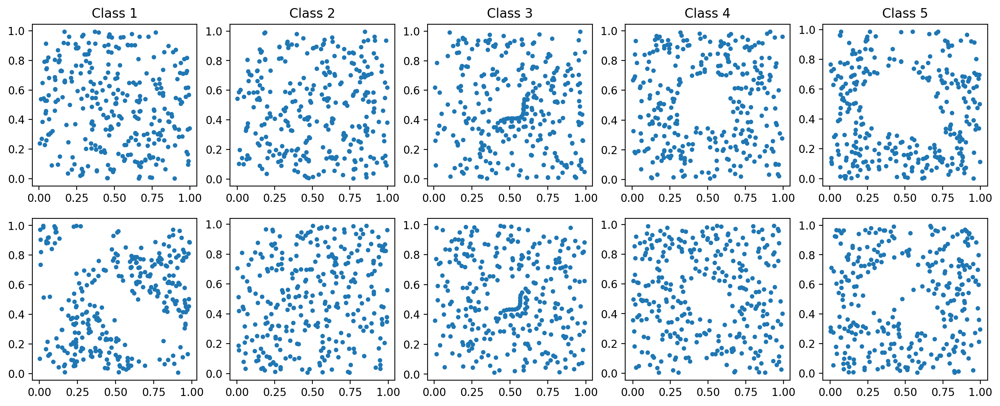

In [306]:
fig, ax = plt.subplots(2, 5, figsize=(16, 6), dpi=200)
for i in range(2):
    for j in range(5):
        if i==0:
            ax[i,j].set_title("Class {}".format(j+1))
        ax[i,j].scatter(X_orbit5k[j*1000+i,:,0], X_orbit5k[j*1000+i,:,1], s=10)

In [307]:
y = np.concatenate(([k*np.ones(1000) for k in range(5)]))

In [490]:
X_orbit5k.shape

(5000, 300, 2)

In [491]:
X = []
vr = ripser.Rips(maxdim=1)

for x_pc in tqdm(X_orbit5k):
    diagram = conv_pd(vr.fit_transform(x_pc))
    X.append(diagram)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


100%|██████████| 5000/5000 [04:16<00:00, 19.46it/s]


#### Dataset 

In [492]:
class Orbit5kDataset(torch.utils.data.Dataset):
    
    def __init__(self, X, y, transform=None):
        self.X = X
        self.y = y
    
    def __len__(self):
        return len(self.y)
    
    def __getitem__(self, idx):
        return self.X[idx], self.y[idx]
    
def collate_fn(data):
    
    tmp_pd, _ = data[0]
    
    n_batch = len(data)
    n_features_pd = tmp_pd.shape[1]
    n_points_pd = max(len(pd) for pd, _ in data)
    inputs_pd = np.zeros((n_batch, n_points_pd, n_features_pd), dtype=float)
    labels = np.zeros(len(data))
    
    for i, (pd, label) in enumerate(data):
        inputs_pd[i][:len(pd)] = pd
        labels[i] = label
    
    return torch.FloatTensor(inputs_pd), torch.Tensor(labels).long()

In [493]:
dataset = Orbit5kDataset(X, y)

#### Train

In [124]:
def plot_training_stats(stats, training_kwargs):

    history, top_accuracy = stats

    print(f"Mean train accuracy across {training_kwargs['n_epochs']} runs - {np.mean(top_accuracy, axis=1)[0]:.3f}, std - {np.std(top_accuracy, axis=1)[0]:.3f}")

    print()
    
    print(f"Mean test accuracy across {training_kwargs['n_epochs']} runs - {np.mean(top_accuracy, axis=1)[1]:.3f}, std - {np.std(top_accuracy, axis=1)[1]:.3f}")
    print("_______________________")
    
    x = np.arange(training_kwargs["n_epochs"])
    loss_ci1 = history.mean(axis=0)[:,0] - history.std(axis=0)[:,0]
    loss_ci2 = history.mean(axis=0)[:,0] + history.std(axis=0)[:,0]
    acc_train_ci1 = history.mean(axis=0)[:,1] - history.std(axis=0)[:,1]
    acc_train_ci2 = history.mean(axis=0)[:,1] + history.std(axis=0)[:,1]
    acc_test_ci1 = history.mean(axis=0)[:,2] - history.std(axis=0)[:,2]
    acc_test_ci2 = history.mean(axis=0)[:,2] + history.std(axis=0)[:,2]

    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16, 4.5), dpi=200)
    fig.suptitle("Persistence diagrams", fontsize=14)
    ax[0].set_title("Loss")
    ax[1].set_title("Accuracy")
    ax[0].set_ylim(0.39, 2.01)
    #ax[1].set_ylim(0.49, 0.81)
    ax[0].plot(history.mean(axis=0)[:,0], c="g")
    ax[0].fill_between(x, loss_ci1, loss_ci2, color="g", alpha=0.1)
    ax[1].plot(history.mean(axis=0)[:,1], c="r", label="Train")
    ax[1].plot(history.mean(axis=0)[:,2], c="b", label="Test")
    ax[1].fill_between(x, acc_train_ci1, acc_train_ci2, color="r", alpha=0.1)
    ax[1].fill_between(x, acc_test_ci1, acc_test_ci2, color="b", alpha=0.1)
    ax[1].legend(loc=4)
    plt.show()

In [93]:
def train_model(model_cls, dataset, n_repeats, n_epochs, batch_size, lr, model_kwargs):

    n_train, n_test = 0.7, 0.3
    
    history = np.zeros((n_repeats, n_epochs, 3))
    top_accuracy = np.zeros((n_repeats, 2))
    criterion = torch.nn.CrossEntropyLoss()
    
    for repeat_idx in range(n_repeats):
        
        # data init
        dataset_train, dataset_test = torch.utils.data.random_split(dataset, [n_train, n_test])
        dataloader_train = torch.utils.data.DataLoader(dataset_train, batch_size=batch_size, shuffle=True, collate_fn=collate_fn, drop_last=True)
        dataloader_test =  torch.utils.data.DataLoader(dataset_test, batch_size=batch_size, shuffle=True, collate_fn=collate_fn, drop_last=True)
        
        # model init
        model = model_cls(**model_kwargs).to("cuda")
        optimizer = torch.optim.Adam(model.parameters(), lr=lr)
        lr_schediler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=n_epochs)

        tq_epoch = trange(n_epochs, desc='Epochs: ',)
        
        for epoch_idx in tq_epoch:
            
            # train
            model.train()
            
            loss_epoch = []
            for batch in dataloader_train:
                loss_batch = criterion(model(batch[0].to("cuda")), batch[1].to("cuda"))
                loss_batch.backward()
                optimizer.step()
                optimizer.zero_grad()
                loss_epoch.append(loss_batch.detach().cpu())
            
            loss_epoch_mean = np.array(loss_epoch).mean()
            history[repeat_idx,epoch_idx,0] = loss_epoch_mean
            lr_schediler.step()
            
            # test
            model.eval()
            
            correct = 0
            for batch in dataloader_train:
                y_hat = model(batch[0].to("cuda")).argmax(dim=1).cpu()
                correct += int((y_hat == batch[1]).sum())
            accuracy_train = correct / len(dataloader_train.dataset)
            history[repeat_idx,epoch_idx,1] = accuracy_train
            if accuracy_train >= top_accuracy[repeat_idx, 0]:
                top_accuracy[repeat_idx, 0] = accuracy_train
    
            correct = 0
            for batch in dataloader_test:
                y_hat = model(batch[0].to("cuda")).argmax(dim=1).cpu()
                correct += int((y_hat == batch[1]).sum())
            accuracy_test = correct / len(dataloader_test.dataset)
            history[repeat_idx,epoch_idx,2] = accuracy_test
            if accuracy_test >= top_accuracy[repeat_idx, 1]:
                top_accuracy[repeat_idx, 1] = accuracy_test
            
            tq_epoch.set_postfix({
                    'Avg epoch loss': loss_epoch_mean,
                    'Accuracy train': accuracy_train,
                    'Accuracy test': accuracy_test,
            })
        print("\r")
    return history, top_accuracy

#### Model

Simplest one

In [106]:
class DeepSets(torch.nn.Module):
    def __init__(self, n_in, n_hidden_enc, n_out_enc, n_hidden_dec=16, n_out_dec=5, dropout=.1):
        super(DeepSets, self).__init__()
        self.encoder = Encoder(n_in, n_hidden_enc, n_out_enc)
        self.decoder = MLP(n_out_enc, n_hidden_dec, n_out_dec)
        self.dropout = torch.nn.Dropout(dropout)
        
    def forward(self, X):
        z_enc = self.dropout(self.encoder(X))
        z = self.decoder(z_enc)
        return z
    
class MLP(torch.nn.Module):
    def __init__(self, n_in, n_hidden, n_out):
        super(MLP, self).__init__()
        self.linear1 = torch.nn.Linear(n_in, n_hidden)
        self.linear2 = torch.nn.Linear(n_hidden, n_out)
        
    def forward(self, X):
        X = torch.nn.functional.relu(self.linear1(X))
        X = self.linear2(X)
        return X
    
class Encoder(torch.nn.Module):
    def __init__(self, n_in, n_hidden, n_out):
        super(Encoder, self).__init__()
        self.mlp = MLP(n_in, n_hidden, n_out)
        self.layer_norm = torch.nn.LayerNorm(n_out)
        
    def forward(self, X):
        X = self.layer_norm(self.mlp(X))
        x = X.mean(dim=1) # aggregation
        return x

In [107]:
deep_sets_kwargs = {"n_in": 3,
                    "n_hidden_enc": 48,
                    "n_out_enc": 5, 
                    "dropout": .2}

In [108]:
training_kwargs = {"n_repeats": 5, 
                  "n_epochs": 50, 
                  "batch_size": 30,
                  "lr": 3e-4}

In [109]:
model = DeepSets(**deep_sets_kwargs,).to("cpu")

In [110]:
torchinfo.summary(model, (1, 300, 3),)

Layer (type:depth-idx)                   Output Shape              Param #
DeepSets                                 [1, 5]                    --
├─Encoder: 1-1                           [1, 5]                    --
│    └─MLP: 2-1                          [1, 300, 5]               --
│    │    └─Linear: 3-1                  [1, 300, 48]              192
│    │    └─Linear: 3-2                  [1, 300, 5]               245
│    └─LayerNorm: 2-2                    [1, 300, 5]               10
├─Dropout: 1-2                           [1, 5]                    --
├─MLP: 1-3                               [1, 5]                    --
│    └─Linear: 2-3                       [1, 16]                   96
│    └─Linear: 2-4                       [1, 5]                    85
Total params: 628
Trainable params: 628
Non-trainable params: 0
Total mult-adds (M): 0.00
Input size (MB): 0.00
Forward/backward pass size (MB): 0.14
Params size (MB): 0.00
Estimated Total Size (MB): 0.15

In [111]:
%%time

history = train_model(DeepSets, dataset, **training_kwargs, model_kwargs=deep_sets_kwargs)

Epochs: 100%|██████████| 50/50 [01:16<00:00,  1.53s/it, Avg epoch loss=1.59, Accuracy train=0.28, Accuracy test=0.267] 


Epochs: 100%|██████████| 50/50 [01:16<00:00,  1.52s/it, Avg epoch loss=1.6, Accuracy train=0.25, Accuracy test=0.233]  


Epochs: 100%|██████████| 50/50 [01:16<00:00,  1.52s/it, Avg epoch loss=1.59, Accuracy train=0.279, Accuracy test=0.301]


Epochs: 100%|██████████| 50/50 [01:16<00:00,  1.53s/it, Avg epoch loss=1.56, Accuracy train=0.311, Accuracy test=0.329]


Epochs: 100%|██████████| 50/50 [01:16<00:00,  1.52s/it, Avg epoch loss=1.52, Accuracy train=0.282, Accuracy test=0.28] 


CPU times: user 26min 42s, sys: 2.57 s, total: 26min 44s
Wall time: 6min 21s


Mean train accuracy across 50 runs - 0.278, std - 0.006

Mean test accuracy across 50 runs - 0.261, std - 0.005
_______________________


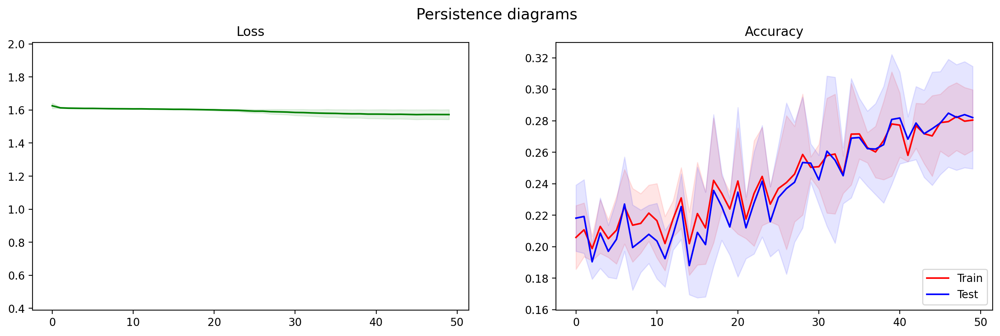

In [125]:
plot_training_stats(history, training_kwargs)

In [126]:
class MultiHeadAttention(torch.nn.Module):
    def __init__(self, num_heads, d_model):
        super(MultiHeadAttention, self).__init__()
        assert d_model % num_heads == 0
        self.num_heads = num_heads
        self.d_head = int(d_model / self.num_heads)
        self.w_qkv = torch.nn.Linear(d_model, 3 * d_model)
        self.w_out = torch.nn.Linear(d_model, d_model)

    def _reset_parameters(self):
        nn.init.xavier_uniform_(self.w_qkv.weight)
        self.w_qkv.bias.data.fill_(0)

        nn.init.xavier_uniform_(self.w_out.weight)
        self.w_out.bias.data.fill_(0)

    def forward(self, x, mask=None):
        # Project into query, key, and value space in one shot.
        qkv = self.w_qkv(x)
        # Split into different heads.
        qkv = einops.rearrange(qkv,
                               'batch seq_len (num_heads head_dim) -> batch num_heads seq_len head_dim',
                               num_heads=self.num_heads,
                               head_dim=3 * self.d_head
                               )

        # For each head split back into query, key, and value.
        q, k, v = einops.rearrange(qkv,
                                   'batch num_heads seq_len (split head_dim) -> split batch num_heads seq_len head_dim',
                                   split=3)

        # Reshape so we can do dot product with query. -1 dimension of query vector needs to match -2 dimension of key.
        k = einops.rearrange(k,
                             'batch num_heads seq_len head_dim -> batch num_heads head_dim seq_len')

        attention_logits = torch.matmul(q, k) / math.sqrt(q.size()[-1])
        if mask is not None:
            # Reshape so it work with the logits matrix
            mask = einops.rearrange(mask,
                                    'batch seq_len -> batch 1 1 seq_len')
            attention_logits = attention_logits.masked_fill(mask == 0, -9e15)
        attention_weights = torch.nn.functional.softmax(attention_logits, dim=-1)

        attention = torch.matmul(attention_weights, v)
        # merge the heads.
        attention = einops.rearrange(attention,
                                     'batch num_heads seq_len head_dim -> batch seq_len (num_heads head_dim)')

        return x + self.w_out(attention)
                #attention_weights

In [127]:
def MLP(n_in: int, n_hidden: int, n_out: int, activation, dropout: int=.1):
    return torch.nn.Sequential(
        torch.nn.LayerNorm(n_in),
        torch.nn.Linear(n_in, n_hidden),
        activation(),
        torch.nn.Dropout(dropout),
        torch.nn.Linear(n_hidden, n_out)
    )

# MLP with residual connection
class ResMLP(torch.nn.Module):
    def __init__(self, n_in, n_hidden, n_out, activation, dropout=.1):
        super(ResMLP, self).__init__()
        self.mlp = MLP(n_in, n_hidden, n_out, activation, dropout)
    
    def forward(self, X):
        return X + self.mlp(X)

def AttentionBlock(num_heads: int, in_feats: int, feedforward_dim: int, activation, dropout=.1):
    return torch.nn.Sequential(
        torch.nn.LayerNorm(in_feats),
        MultiHeadAttention(num_heads=num_heads, d_model=in_feats,),
        ResMLP(n_in=in_feats, n_hidden=feedforward_dim, n_out=in_feats, 
               activation=activation, dropout=dropout)
    )
    
class Encoder(torch.nn.Module):
    def __init__(self, n_in, n_hidden, n_out, n_head, feedforward_dim, activation, n_layers = 1,  dropout = .1):
        super(Encoder, self).__init__()
        self.embedder = torch.nn.Sequential(
             MLP(n_in=n_in, n_hidden=n_hidden, n_out=n_out, activation=activation, dropout=dropout,),
            *[AttentionBlock(num_heads=n_head, in_feats=n_out, feedforward_dim=feedforward_dim,
                          activation=activation) for _ in range(n_layers)],
            einops.layers.torch.Reduce("batch tokens features -> batch features", reduction="mean"),
        )
    def forward(self, X):
        return self.embedder(X)

class PersTransformer(torch.nn.Module):
    def __init__(self, n_in, n_hidden_enc, n_out_enc, n_head_enc, dim_feed_enc, activation, num_transformer_layers, n_hidden_dec=16, n_out_dec=5, dropout=.1):
        super(PersTransformer, self).__init__()
        self.encoder = Encoder(n_in, n_hidden_enc, n_out_enc, n_head_enc, dim_feed_enc, activation, num_transformer_layers, dropout)
        self.decoder = MLP(n_out_enc, n_hidden_dec, n_out_dec, activation)
        
    def forward(self, X):
        z_enc = self.encoder(X)
        z = self.decoder(z_enc)
        return z

In [128]:
pers_transformer_kwargs = {"n_in": 3, 
                          "n_hidden_enc": 48, 
                          "n_out_enc": 16,
                          "n_head_enc": 4,
                          "dim_feed_enc": 48,
                          "activation": torch.nn.ReLU,
                           "num_transformer_layers": 1
                          }

In [129]:
training_kwargs = {"n_repeats": 5, 
                  "n_epochs": 50, 
                  "batch_size": 25,
                  "lr": 3e-4}

In [130]:
model = PersTransformer(**pers_transformer_kwargs)

In [131]:
torchinfo.summary(model, (1, 300, 3),)

Layer (type:depth-idx)                        Output Shape              Param #
PersTransformer                               [1, 5]                    --
├─Encoder: 1-1                                [1, 16]                   --
│    └─Sequential: 2-1                        [1, 16]                   --
│    │    └─Sequential: 3-1                   [1, 300, 16]              982
│    │    └─Sequential: 3-2                   [1, 300, 16]              2,752
│    │    └─Reduce: 3-3                       [1, 16]                   --
├─Sequential: 1-2                             [1, 5]                    --
│    └─LayerNorm: 2-2                         [1, 16]                   32
│    └─Linear: 2-3                            [1, 16]                   272
│    └─ReLU: 2-4                              [1, 16]                   --
│    └─Dropout: 2-5                           [1, 16]                   --
│    └─Linear: 2-6                            [1, 5]                    85
Total params: 4

In [132]:
%%time
history = train_model(PersTransformer, dataset, **training_kwargs, model_kwargs=pers_transformer_kwargs)

Epochs: 100%|██████████| 50/50 [05:05<00:00,  6.11s/it, Avg epoch loss=1.53, Accuracy train=0.318, Accuracy test=0.312]


Epochs: 100%|██████████| 50/50 [05:07<00:00,  6.14s/it, Avg epoch loss=1.52, Accuracy train=0.3, Accuracy test=0.301]  


Epochs: 100%|██████████| 50/50 [05:03<00:00,  6.08s/it, Avg epoch loss=1.52, Accuracy train=0.314, Accuracy test=0.306]


Epochs: 100%|██████████| 50/50 [05:02<00:00,  6.04s/it, Avg epoch loss=1.52, Accuracy train=0.307, Accuracy test=0.327]


Epochs: 100%|██████████| 50/50 [04:58<00:00,  5.97s/it, Avg epoch loss=1.52, Accuracy train=0.299, Accuracy test=0.296]

Mean train accuracy across 50 runs - 0.315, std - 0.003

Mean test accuracy across 50 runs - 0.306, std - 0.004
_______________________


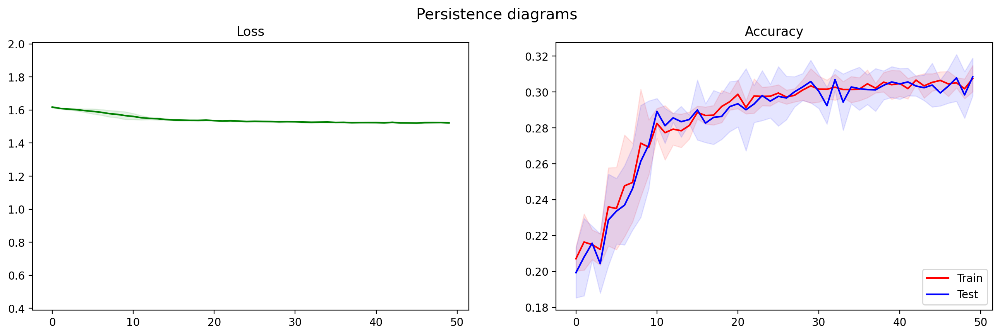

In [134]:
plot_training_stats(history, training_kwargs)

### Let's change the activation function to GeLU and tripple the number of blocks

In [139]:
pers_transformer_kwargs = {"n_in": 3, 
                          "n_hidden_enc": 48, 
                          "n_out_enc": 32,
                          "n_head_enc": 4,
                          "dim_feed_enc": 48,
                          "activation": torch.nn.GELU,
                           "num_transformer_layers": 3
                          }

In [140]:
training_kwargs = {"n_repeats": 5, 
                  "n_epochs": 50, 
                  "batch_size": 25,
                  "lr": 3e-4}

In [141]:
model = PersTransformer(**pers_transformer_kwargs)

In [142]:
torchinfo.summary(model, (1, 300, 3),)

Layer (type:depth-idx)                             Output Shape              Param #
PersTransformer                                    [1, 5]                    --
├─Encoder: 1-1                                     [1, 32]                   --
│    └─Sequential: 2-1                             [1, 32]                   --
│    │    └─Sequential: 3-1                        [1, 300, 32]              1,766
│    │    └─Sequential: 3-2                        [1, 300, 32]              7,504
│    │    └─Sequential: 3-3                        [1, 300, 32]              7,504
│    │    └─Sequential: 3-4                        [1, 300, 32]              7,504
│    │    └─Reduce: 3-5                            [1, 32]                   --
├─Sequential: 1-2                                  [1, 5]                    --
│    └─LayerNorm: 2-2                              [1, 32]                   64
│    └─Linear: 2-3                                 [1, 16]                   528
│    └─GELU: 2-4      

In [143]:
%%time
history = train_model(PersTransformer, dataset, **training_kwargs, model_kwargs=pers_transformer_kwargs)

Epochs: 100%|██████████| 50/50 [12:58<00:00, 15.57s/it, Avg epoch loss=1.5, Accuracy train=0.312, Accuracy test=0.321] 


Epochs: 100%|██████████| 50/50 [12:57<00:00, 15.55s/it, Avg epoch loss=1.51, Accuracy train=0.309, Accuracy test=0.315]


Epochs: 100%|██████████| 50/50 [12:56<00:00, 15.52s/it, Avg epoch loss=1.51, Accuracy train=0.309, Accuracy test=0.297]


Epochs: 100%|██████████| 50/50 [12:57<00:00, 15.56s/it, Avg epoch loss=1.5, Accuracy train=0.308, Accuracy test=0.295] 


Epochs: 100%|██████████| 50/50 [12:53<00:00, 15.47s/it, Avg epoch loss=1.49, Accuracy train=0.328, Accuracy test=0.328]

Mean train accuracy across 50 runs - 0.322, std - 0.004

Mean test accuracy across 50 runs - 0.315, std - 0.000
_______________________


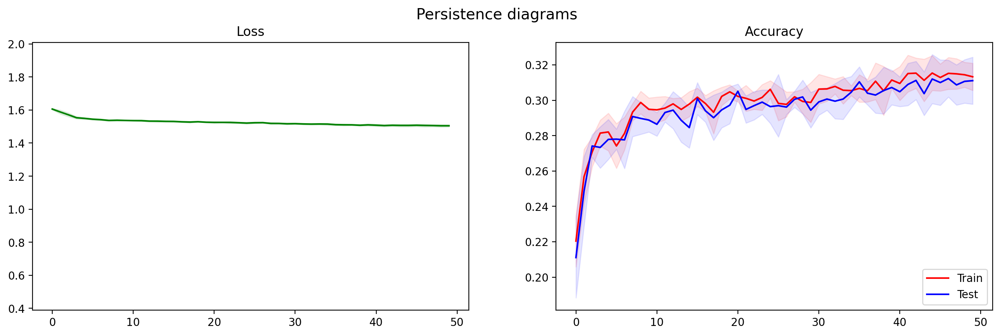

In [144]:
plot_training_stats(history, training_kwargs)

In [145]:
pers_transformer_kwargs = {"n_in": 3, 
                          "n_hidden_enc": 96, 
                          "n_out_enc": 48,
                          "n_head_enc": 8,
                          "dim_feed_enc": 48,
                          "activation": torch.nn.LeakyReLU,
                           "num_transformer_layers": 5
                          }

In [147]:
training_kwargs = {"n_repeats": 5, 
                  "n_epochs": 50, 
                  "batch_size": 100,
                  "lr": 3e-4}

In [148]:
model = PersTransformer(**pers_transformer_kwargs)

In [149]:
torchinfo.summary(model, (1, 300, 3),)

Layer (type:depth-idx)                             Output Shape              Param #
PersTransformer                                    [1, 5]                    --
├─Encoder: 1-1                                     [1, 48]                   --
│    └─Sequential: 2-1                             [1, 48]                   --
│    │    └─Sequential: 3-1                        [1, 300, 48]              5,046
│    │    └─Sequential: 3-2                        [1, 300, 48]              14,304
│    │    └─Sequential: 3-3                        [1, 300, 48]              14,304
│    │    └─Sequential: 3-4                        [1, 300, 48]              14,304
│    │    └─Sequential: 3-5                        [1, 300, 48]              14,304
│    │    └─Sequential: 3-6                        [1, 300, 48]              14,304
│    │    └─Reduce: 3-7                            [1, 48]                   --
├─Sequential: 1-2                                  [1, 5]                    --
│    └─Layer

In [150]:
%%time
history = train_model(PersTransformer, dataset, **training_kwargs, model_kwargs=pers_transformer_kwargs)

Epochs: 100%|██████████| 50/50 [30:04<00:00, 36.09s/it, Avg epoch loss=1.52, Accuracy train=0.306, Accuracy test=0.305]


Epochs: 100%|██████████| 50/50 [29:23<00:00, 35.26s/it, Avg epoch loss=1.52, Accuracy train=0.306, Accuracy test=0.289]


Epochs: 100%|██████████| 50/50 [29:04<00:00, 34.89s/it, Avg epoch loss=1.51, Accuracy train=0.31, Accuracy test=0.284] 


Epochs: 100%|██████████| 50/50 [29:04<00:00, 34.90s/it, Avg epoch loss=1.52, Accuracy train=0.306, Accuracy test=0.291]


Epochs: 100%|██████████| 50/50 [29:20<00:00, 35.22s/it, Avg epoch loss=1.51, Accuracy train=0.297, Accuracy test=0.295]


CPU times: user 2h 38min 22s, sys: 39 s, total: 2h 39min 1s
Wall time: 2h 26min 57s


Mean train accuracy across 50 runs - 0.313, std - 0.001

Mean test accuracy across 50 runs - 0.306, std - 0.004
_______________________


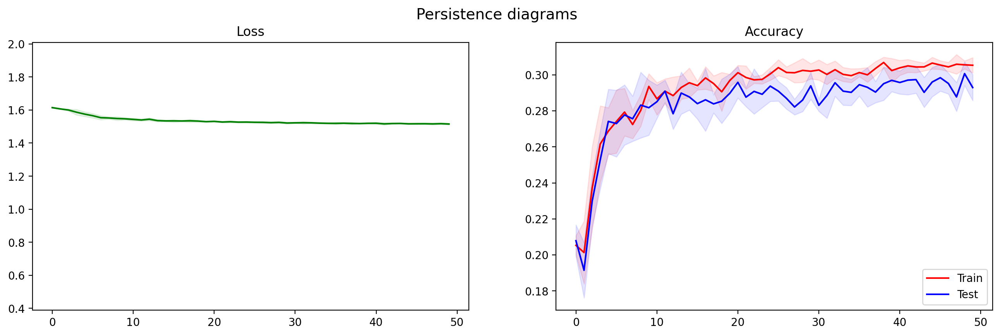

In [151]:
plot_training_stats(history, training_kwargs)

There's not much improvement from scaling beyond previous point; moreover, generally performance even decreases -- our data is quite noisy (with features that don't live long), so it may be much more beneficial to work with the data, not architecture.

However, as usual, LayerNorms, GeLU and number of parameters and residual connections together with self-attention make a huge progress beyond plain DeepSets

In [152]:
from collections import defaultdict
import scipy.special

In [224]:
def top_n_collate(data, top_n):
    
    tmp_pd, _ = data[0]
    
    n_batch = len(data)
    n_features_pd = tmp_pd.shape[1]
    n_points_pd = top_n
    inputs_pd = np.zeros((n_batch, n_points_pd, n_features_pd), dtype=float)
    labels = np.zeros(len(data))
    
    for i, (pd, label) in enumerate(data):
        # permute rows 
        top_n_pd = np.random.permutation(
            # select the most persistent
            pd[np.argsort((pd[:, 1] - pd[:, 0]), )[::-1]][:top_n]
        )
        inputs_pd[i] = top_n_pd
        labels[i] = label
    
    return torch.FloatTensor(inputs_pd), torch.Tensor(labels).long()

In [225]:
def top_n_by_group_collate_fn(data, top_n: int, ):
    
    tmp_pd, _ = data[0]
    
    n_batch = len(data)
    n_features_pd = tmp_pd.shape[1]

    points = []
    
    for pd, label in data:
        # generate local dict
        hom_features = defaultdict(list)
        # aggregate features
        for elem in pd:
            hom_features[elem[2]].append(elem)
        hom_features = {k: np.array(v) for k, v in hom_features.items()}
        # stack top_n for each group
        top_n_pd = np.vstack([feat[np.argsort((feat[:, 1] - feat[:, 0]), )[::-1]][:top_n] 
                                  for feat in hom_features.values()])
        points.append(top_n_pd)

    n_points_pd = max([len(pts) for pts in points])
    inputs_pd = np.zeros((n_batch, n_points_pd, n_features_pd), dtype=float)
    labels = np.zeros(len(data))
    
    for i, (_, label) in enumerate(data):
    
        inputs_pd[i][:len(points[i])] = np.random.permutation(points[i])
        labels[i] = label
    
    return torch.FloatTensor(inputs_pd), torch.Tensor(labels).long()

In [539]:
def top_n_sample_by_group_collate_fn(data, top_n: int, ):
    
    tmp_pd, _ = data[0]
    
    n_batch = len(data)
    n_features_pd = tmp_pd.shape[1]

    points = []
    
    for i, (pd, label) in enumerate(data):
        # generate local dict
        hom_features = defaultdict(list)
        # aggregate features
        for elem in pd:
            hom_features[elem[2]].append(elem)
        hom_features = {k: np.array(v) for k, v in hom_features.items()}
        
        # stack top_n sampled by persistence to account for variability in terms of inputs 
        top_n_pd = np.vstack([feat[np.random.choice(np.arange(feat.shape[0]), 
                                                   size=top_n if top_n < feat.shape[0] else feat.shape[0], 
                                                   p=(feat[:, 1] - feat[:, 0])/np.sum(feat[:, 1] - feat[:, 0]),
                                                   replace=False)]
        for feat in hom_features.values()])

        points.append(top_n_pd)

    n_points_pd = max([len(pts) for pts in points])
    inputs_pd = np.zeros((n_batch, n_points_pd, n_features_pd), dtype=float)
    labels = np.zeros(len(data))

    for i, (_, label) in enumerate(data):
        
        inputs_pd[i][:len(points[i])] = np.random.permutation(points[i])
        labels[i] = label
    
    return torch.FloatTensor(inputs_pd), torch.Tensor(labels).long()

In [181]:
def train_model(model_cls, dataset, n_repeats, n_epochs, batch_size, lr, collate_fn, collate_kwargs, model_kwargs):

    n_train, n_test = 0.7, 0.3
    
    history = np.zeros((n_repeats, n_epochs, 3))
    top_accuracy = np.zeros((n_repeats, 2))
    criterion = torch.nn.CrossEntropyLoss()
    
    for repeat_idx in range(n_repeats):
        
        # data init and data_collator parameters
        dataset_train, dataset_test = torch.utils.data.random_split(dataset, [n_train, n_test])
        dataloader_train = torch.utils.data.DataLoader(dataset_train, batch_size=batch_size, shuffle=True, 
                                                       collate_fn=lambda data, kwargs=collate_kwargs: collate_fn(data, **kwargs), 
                                                       drop_last=True)
        dataloader_test =  torch.utils.data.DataLoader(dataset_test, batch_size=batch_size, shuffle=True, 
                                                       collate_fn=lambda data, kwargs=collate_kwargs: collate_fn(data, **kwargs),
                                                       drop_last=True)
        
        # model init
        model = model_cls(**model_kwargs).to("cuda")
        optimizer = torch.optim.Adam(model.parameters(), lr=lr)
        lr_schediler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=n_epochs)

        tq_epoch = trange(n_epochs, desc='Epochs: ',)
        
        for epoch_idx in tq_epoch:
            
            # train
            model.train()
            
            loss_epoch = []
            for batch in dataloader_train:
                loss_batch = criterion(model(batch[0].to("cuda")), batch[1].to("cuda"))
                loss_batch.backward()
                optimizer.step()
                optimizer.zero_grad()
                loss_epoch.append(loss_batch.detach().cpu())
            
            loss_epoch_mean = np.array(loss_epoch).mean()
            history[repeat_idx,epoch_idx,0] = loss_epoch_mean
            lr_schediler.step()
            
            # test
            model.eval()
            
            correct = 0
            for batch in dataloader_train:
                y_hat = model(batch[0].to("cuda")).argmax(dim=1).cpu()
                correct += int((y_hat == batch[1]).sum())
            accuracy_train = correct / len(dataloader_train.dataset)
            history[repeat_idx,epoch_idx,1] = accuracy_train
            if accuracy_train >= top_accuracy[repeat_idx, 0]:
                top_accuracy[repeat_idx, 0] = accuracy_train
    
            correct = 0
            for batch in dataloader_test:
                y_hat = model(batch[0].to("cuda")).argmax(dim=1).cpu()
                correct += int((y_hat == batch[1]).sum())
            accuracy_test = correct / len(dataloader_test.dataset)
            history[repeat_idx,epoch_idx,2] = accuracy_test
            if accuracy_test >= top_accuracy[repeat_idx, 1]:
                top_accuracy[repeat_idx, 1] = accuracy_test
            
            tq_epoch.set_postfix({
                    'Avg epoch loss': loss_epoch_mean,
                    'Accuracy train': accuracy_train,
                    'Accuracy test': accuracy_test,
            })
        print("\r")
    return history, top_accuracy

### Top_n_collate

In [227]:
pers_transformer_kwargs = {"n_in": 3, 
                          "n_hidden_enc": 48, 
                          "n_out_enc": 24,
                          "n_head_enc": 4,
                          "dim_feed_enc": 48,
                          "activation": torch.nn.GELU,
                           "num_transformer_layers": 3
                          }

In [228]:
training_kwargs = {"n_repeats": 5, 
                  "n_epochs": 50, 
                  "batch_size": 25,
                  "lr": 3e-4}

In [231]:
collate_kwargs = {"top_n": 45}

In [235]:
%%time
history = train_model(PersTransformer, dataset, **training_kwargs, 
                      model_kwargs=pers_transformer_kwargs,
                      collate_fn=top_n_collate, 
                      collate_kwargs=collate_kwargs)

Epochs: 100%|██████████| 50/50 [02:35<00:00,  3.11s/it, Avg epoch loss=0.936, Accuracy train=0.618, Accuracy test=0.634]


Epochs: 100%|██████████| 50/50 [02:33<00:00,  3.07s/it, Avg epoch loss=0.97, Accuracy train=0.603, Accuracy test=0.643] 


Epochs: 100%|██████████| 50/50 [02:32<00:00,  3.06s/it, Avg epoch loss=0.936, Accuracy train=0.623, Accuracy test=0.636]


Epochs: 100%|██████████| 50/50 [02:31<00:00,  3.03s/it, Avg epoch loss=1, Accuracy train=0.589, Accuracy test=0.601]   


Epochs: 100%|██████████| 50/50 [02:30<00:00,  3.02s/it, Avg epoch loss=0.988, Accuracy train=0.61, Accuracy test=0.606] 


CPU times: user 12min 45s, sys: 932 ms, total: 12min 46s
Wall time: 12min 44s


Mean train accuracy across 50 runs - 0.630, std - 0.007

Mean test accuracy across 50 runs - 0.625, std - 0.021
_______________________


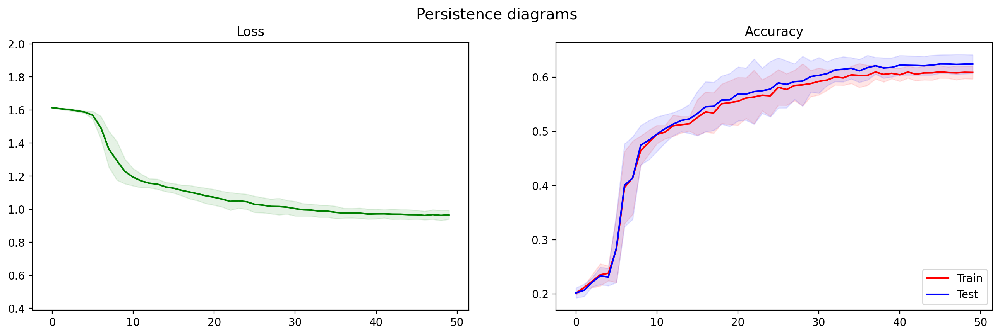

In [236]:
plot_training_stats(history, training_kwargs)

In [555]:
pers_transformer_kwargs = {"n_in": 3, 
                          "n_hidden_enc": 48, 
                          "n_out_enc": 24,
                          "n_head_enc": 4,
                          "dim_feed_enc": 48,
                          "activation": torch.nn.GELU,
                           "num_transformer_layers": 3
                          }

In [556]:
training_kwargs = {"n_repeats": 5, 
                  "n_epochs": 50, 
                  "batch_size": 25,
                  "lr": 3e-4}

In [558]:
collate_kwargs = {"top_n": 25}

In [559]:
%%time
history = train_model(PersTransformer, dataset, **training_kwargs, 
                      model_kwargs=pers_transformer_kwargs,
                      collate_fn=top_n_collate, 
                      collate_kwargs=collate_kwargs)

Epochs: 100%|██████████| 50/50 [02:31<00:00,  3.04s/it, Avg epoch loss=0.926, Accuracy train=0.637, Accuracy test=0.617]


Epochs: 100%|██████████| 50/50 [02:28<00:00,  2.98s/it, Avg epoch loss=0.917, Accuracy train=0.63, Accuracy test=0.624] 


Epochs: 100%|██████████| 50/50 [02:32<00:00,  3.05s/it, Avg epoch loss=0.912, Accuracy train=0.627, Accuracy test=0.625]


Epochs: 100%|██████████| 50/50 [02:31<00:00,  3.03s/it, Avg epoch loss=0.923, Accuracy train=0.635, Accuracy test=0.609]


Epochs: 100%|██████████| 50/50 [02:28<00:00,  2.98s/it, Avg epoch loss=0.908, Accuracy train=0.643, Accuracy test=0.612]


CPU times: user 12min 35s, sys: 612 ms, total: 12min 35s
Wall time: 12min 33s


Mean train accuracy across 50 runs - 0.630, std - 0.009

Mean test accuracy across 50 runs - 0.635, std - 0.000
_______________________


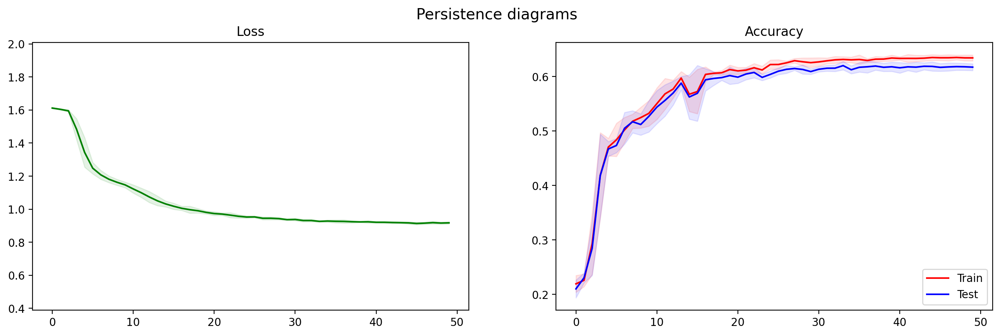

In [560]:
plot_training_stats(history, training_kwargs)

### Top_n_by_group

In [237]:
pers_transformer_kwargs = {"n_in": 3, 
                          "n_hidden_enc": 48, 
                          "n_out_enc": 24,
                          "n_head_enc": 4,
                          "dim_feed_enc": 48,
                          "activation": torch.nn.GELU,
                           "num_transformer_layers": 3
                          }

In [238]:
training_kwargs = {"n_repeats": 5, 
                  "n_epochs": 50, 
                  "batch_size": 25,
                  "lr": 3e-4}

In [239]:
collate_kwargs = {"top_n": 20,}

In [241]:
%%time
history = train_model(PersTransformer, dataset, **training_kwargs, 
                      model_kwargs=pers_transformer_kwargs, 
                      collate_fn=top_n_by_group_collate_fn, 
                      collate_kwargs=collate_kwargs)

Epochs: 100%|██████████| 50/50 [04:07<00:00,  4.95s/it, Avg epoch loss=0.931, Accuracy train=0.66, Accuracy test=0.647] 


Epochs: 100%|██████████| 50/50 [04:05<00:00,  4.90s/it, Avg epoch loss=0.879, Accuracy train=0.682, Accuracy test=0.684]


Epochs: 100%|██████████| 50/50 [04:08<00:00,  4.98s/it, Avg epoch loss=0.973, Accuracy train=0.596, Accuracy test=0.604]


Epochs: 100%|██████████| 50/50 [04:10<00:00,  5.00s/it, Avg epoch loss=1.52, Accuracy train=0.299, Accuracy test=0.287]


Epochs: 100%|██████████| 50/50 [04:10<00:00,  5.02s/it, Avg epoch loss=1.06, Accuracy train=0.637, Accuracy test=0.643]


CPU times: user 20min 47s, sys: 891 ms, total: 20min 48s
Wall time: 20min 42s


Mean train accuracy across 50 runs - 0.656, std - 0.006

Mean test accuracy across 50 runs - 0.688, std - 0.005
_______________________


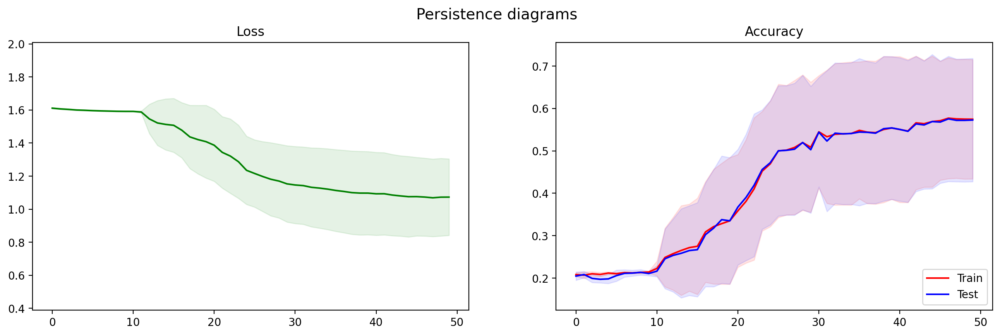

In [242]:
plot_training_stats(history, training_kwargs)

Note: we get an improvement from the previous setting, however taking top 30 points by group results in huge performance drop (~ 3 times), so the number of points taken becomes the crucial hyperparameter that has to be chosen with great care

In [262]:
collate_kwargs = {"top_n": 10,}

In [264]:
%%time
history = train_model(PersTransformer, dataset, **training_kwargs, 
                      model_kwargs=pers_transformer_kwargs, 
                      collate_fn=top_n_by_group_collate_fn, 
                      collate_kwargs=collate_kwargs)

Epochs: 100%|██████████| 50/50 [04:01<00:00,  4.84s/it, Avg epoch loss=0.863, Accuracy train=0.676, Accuracy test=0.687]


Epochs: 100%|██████████| 50/50 [04:01<00:00,  4.83s/it, Avg epoch loss=0.974, Accuracy train=0.627, Accuracy test=0.621]


Epochs: 100%|██████████| 50/50 [04:04<00:00,  4.90s/it, Avg epoch loss=0.932, Accuracy train=0.638, Accuracy test=0.637]


Epochs: 100%|██████████| 50/50 [04:09<00:00,  4.98s/it, Avg epoch loss=0.885, Accuracy train=0.647, Accuracy test=0.652]


Epochs: 100%|██████████| 50/50 [04:03<00:00,  4.88s/it, Avg epoch loss=0.87, Accuracy train=0.666, Accuracy test=0.681] 


CPU times: user 20min 26s, sys: 832 ms, total: 20min 26s
Wall time: 20min 21s


Mean train accuracy across 50 runs - 0.687, std - 0.008

Mean test accuracy across 50 runs - 0.625, std - 0.003
_______________________


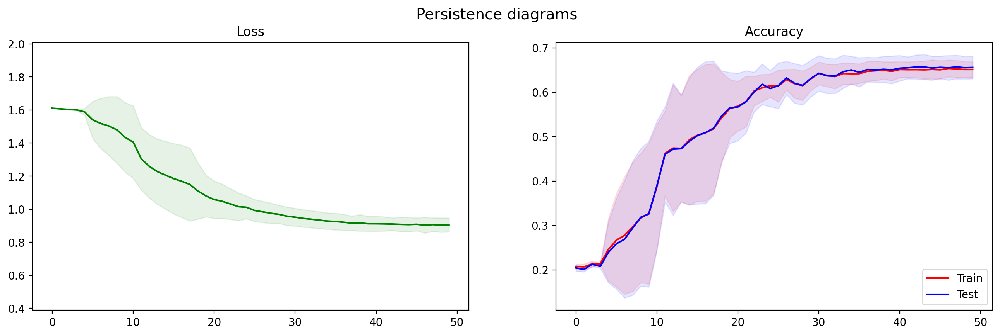

In [265]:
plot_training_stats(history, training_kwargs)

Note: scaling batch size to 200 generally worsen the performance (interestingly) 

In [312]:
training_kwargs = {"n_repeats": 5, 
                  "n_epochs": 50, 
                  "batch_size": 200,
                  "lr": 3e-4}

In [313]:
collate_kwargs = {"top_n": 10,}

In [314]:
%%time
history = train_model(PersTransformer, dataset, **training_kwargs, 
                      model_kwargs=pers_transformer_kwargs, 
                      collate_fn=top_n_by_group_collate_fn, 
                      collate_kwargs=collate_kwargs)

Epochs: 100%|██████████| 50/50 [02:15<00:00,  2.72s/it, Avg epoch loss=1.43, Accuracy train=0.258, Accuracy test=0.247]


Epochs: 100%|██████████| 50/50 [02:16<00:00,  2.73s/it, Avg epoch loss=1.3, Accuracy train=0.401, Accuracy test=0.371] 


Epochs: 100%|██████████| 50/50 [02:16<00:00,  2.73s/it, Avg epoch loss=1.38, Accuracy train=0.355, Accuracy test=0.32] 


Epochs: 100%|██████████| 50/50 [02:16<00:00,  2.73s/it, Avg epoch loss=1.41, Accuracy train=0.401, Accuracy test=0.389]


Epochs: 100%|██████████| 50/50 [02:16<00:00,  2.73s/it, Avg epoch loss=1.25, Accuracy train=0.475, Accuracy test=0.464]


CPU times: user 11min 25s, sys: 291 ms, total: 11min 26s
Wall time: 11min 22s


Mean train accuracy across 50 runs - 0.291, std - 0.017

Mean test accuracy across 50 runs - 0.389, std - 0.013
_______________________


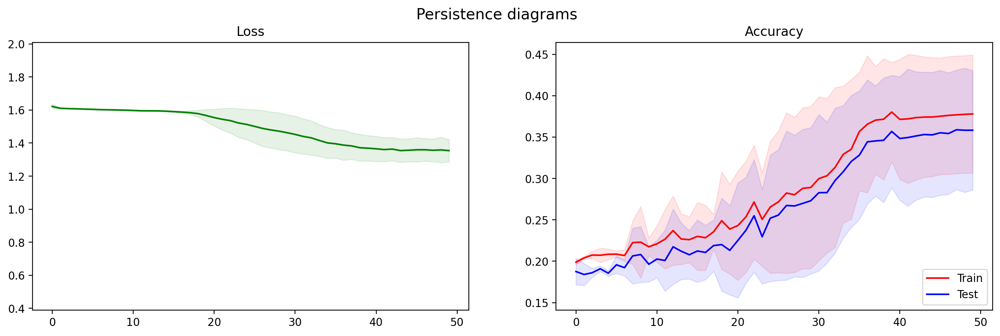

In [318]:
plot_training_stats(history, training_kwargs)

Descreasing batch size stabilizes the training. Possibly it may be due to the presence of noisy (short-living) features even while selecting top_n features for some diagrams, so as the number of such elements growth with the batch size, the variance of gradient increases, so we get a decrease in performance

In [325]:
training_kwargs = {"n_repeats": 5, 
                  "n_epochs": 50, 
                  "batch_size": 15,
                  "lr": 3e-4}

In [326]:
collate_kwargs = {"top_n": 10,}

In [327]:
%%time
history = train_model(PersTransformer, dataset, **training_kwargs, 
                      model_kwargs=pers_transformer_kwargs, 
                      collate_fn=top_n_by_group_collate_fn, 
                      collate_kwargs=collate_kwargs)

Epochs: 100%|██████████| 50/50 [05:26<00:00,  6.53s/it, Avg epoch loss=1.08, Accuracy train=0.517, Accuracy test=0.509]


Epochs: 100%|██████████| 50/50 [05:24<00:00,  6.50s/it, Avg epoch loss=0.852, Accuracy train=0.665, Accuracy test=0.671]


Epochs: 100%|██████████| 50/50 [05:38<00:00,  6.78s/it, Avg epoch loss=0.85, Accuracy train=0.678, Accuracy test=0.681] 


Epochs: 100%|██████████| 50/50 [05:36<00:00,  6.72s/it, Avg epoch loss=0.88, Accuracy train=0.655, Accuracy test=0.667] 


Epochs: 100%|██████████| 50/50 [05:37<00:00,  6.76s/it, Avg epoch loss=0.834, Accuracy train=0.685, Accuracy test=0.663]


CPU times: user 27min 49s, sys: 1.35 s, total: 27min 50s
Wall time: 27min 44s


Mean train accuracy across 50 runs - 0.519, std - 0.002

Mean test accuracy across 50 runs - 0.673, std - 0.004
_______________________


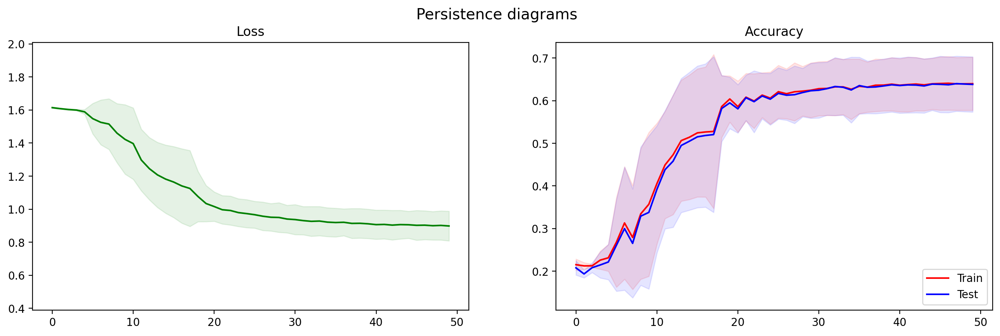

In [332]:
plot_training_stats(history, training_kwargs)

The first two approaches not only improve the performance by a large amount, but also make training faster as attention matrices have lower number of dimensions due to bounded number of points. 

The second one is slightly improves beyond the first.

### Top_n_sample_by_group

In [540]:
pers_transformer_kwargs = {"n_in": 3, 
                          "n_hidden_enc": 48, 
                          "n_out_enc": 24,
                          "n_head_enc": 4,
                          "dim_feed_enc": 48,
                          "activation": torch.nn.GELU,
                           "num_transformer_layers": 3
                          }

In [541]:
training_kwargs = {"n_repeats": 5, 
                  "n_epochs": 50, 
                  "batch_size": 15,
                  "lr": 3e-4}

In [543]:
collate_kwargs = {"top_n": 15, }

In [545]:
%%time
history = train_model(PersTransformer, dataset, **training_kwargs, 
                      model_kwargs=pers_transformer_kwargs,
                      collate_fn=top_n_sample_by_group_collate_fn, 
                      collate_kwargs=collate_kwargs)

Epochs: 100%|██████████| 50/50 [07:27<00:00,  8.95s/it, Avg epoch loss=1.07, Accuracy train=0.585, Accuracy test=0.576]


Epochs: 100%|██████████| 50/50 [07:31<00:00,  9.03s/it, Avg epoch loss=1.02, Accuracy train=0.597, Accuracy test=0.589]


Epochs: 100%|██████████| 50/50 [07:17<00:00,  8.76s/it, Avg epoch loss=1.26, Accuracy train=0.464, Accuracy test=0.478]


Epochs: 100%|██████████| 50/50 [07:09<00:00,  8.58s/it, Avg epoch loss=1.12, Accuracy train=0.572, Accuracy test=0.583]


Epochs: 100%|██████████| 50/50 [07:07<00:00,  8.55s/it, Avg epoch loss=1.09, Accuracy train=0.581, Accuracy test=0.567]


CPU times: user 36min 41s, sys: 1.93 s, total: 36min 43s
Wall time: 36min 33s


Mean train accuracy across 50 runs - 0.586, std - 0.001

Mean test accuracy across 50 runs - 0.601, std - 0.002
_______________________


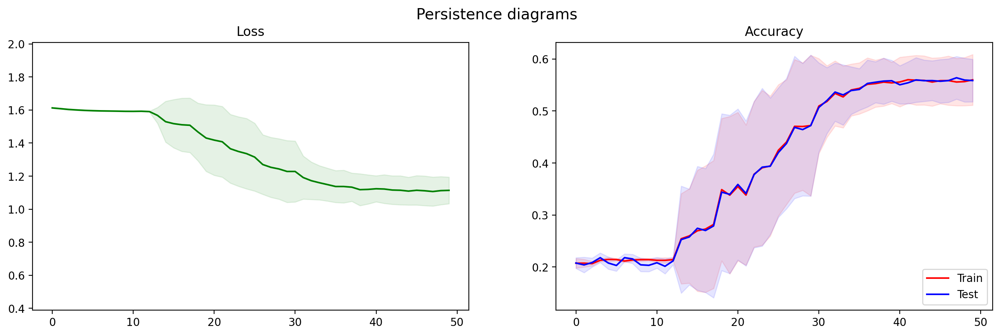

In [546]:
plot_training_stats(history, training_kwargs)

In [547]:
training_kwargs = {"n_repeats": 5, 
                  "n_epochs": 50, 
                  "batch_size": 30,
                  "lr": 3e-4}

In [548]:
collate_kwargs = {"top_n": 7, }

In [549]:
%%time
history = train_model(PersTransformer, dataset, **training_kwargs, 
                      model_kwargs=pers_transformer_kwargs,
                      collate_fn=top_n_sample_by_group_collate_fn, 
                      collate_kwargs=collate_kwargs)

Epochs: 100%|██████████| 50/50 [05:24<00:00,  6.50s/it, Avg epoch loss=1.3, Accuracy train=0.458, Accuracy test=0.473] 


Epochs: 100%|██████████| 50/50 [05:11<00:00,  6.24s/it, Avg epoch loss=1.25, Accuracy train=0.473, Accuracy test=0.475]


Epochs: 100%|██████████| 50/50 [05:08<00:00,  6.17s/it, Avg epoch loss=1.25, Accuracy train=0.479, Accuracy test=0.493]


Epochs: 100%|██████████| 50/50 [05:12<00:00,  6.25s/it, Avg epoch loss=1.28, Accuracy train=0.466, Accuracy test=0.471]


Epochs: 100%|██████████| 50/50 [05:14<00:00,  6.29s/it, Avg epoch loss=1.26, Accuracy train=0.467, Accuracy test=0.495]


CPU times: user 26min 19s, sys: 921 ms, total: 26min 20s
Wall time: 26min 12s


Mean train accuracy across 50 runs - 0.484, std - 0.009

Mean test accuracy across 50 runs - 0.484, std - 0.009
_______________________


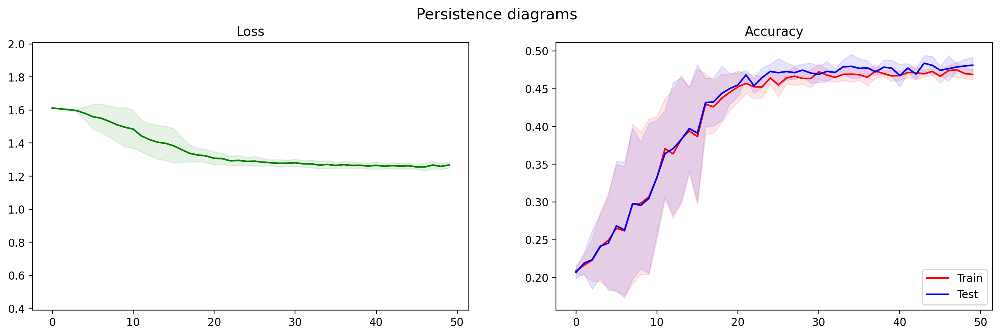

In [550]:
plot_training_stats(history, training_kwargs)

In [551]:
training_kwargs = {"n_repeats": 5, 
                  "n_epochs": 50, 
                  "batch_size": 30,
                  "lr": 3e-4}

In [552]:
collate_kwargs = {"top_n": 25, }

In [553]:
%%time
history = train_model(PersTransformer, dataset, **training_kwargs, 
                      model_kwargs=pers_transformer_kwargs,
                      collate_fn=top_n_sample_by_group_collate_fn, 
                      collate_kwargs=collate_kwargs)

Epochs: 100%|██████████| 50/50 [05:54<00:00,  7.08s/it, Avg epoch loss=1.59, Accuracy train=0.225, Accuracy test=0.199]


Epochs: 100%|██████████| 50/50 [06:03<00:00,  7.27s/it, Avg epoch loss=1.24, Accuracy train=0.483, Accuracy test=0.485]


Epochs: 100%|██████████| 50/50 [05:57<00:00,  7.14s/it, Avg epoch loss=1.29, Accuracy train=0.481, Accuracy test=0.487]


Epochs: 100%|██████████| 50/50 [05:54<00:00,  7.10s/it, Avg epoch loss=1.59, Accuracy train=0.22, Accuracy test=0.203] 


Epochs: 100%|██████████| 50/50 [05:53<00:00,  7.08s/it, Avg epoch loss=1.58, Accuracy train=0.23, Accuracy test=0.207] 


CPU times: user 29min 51s, sys: 951 ms, total: 29min 52s
Wall time: 29min 43s


Mean train accuracy across 50 runs - 0.235, std - 0.013

Mean test accuracy across 50 runs - 0.487, std - 0.003
_______________________


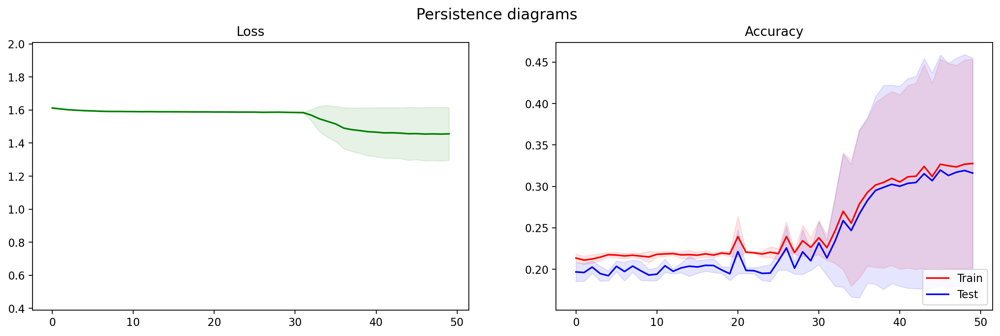

In [554]:
plot_training_stats(history, training_kwargs)

Sampling is not beneficial regardless number of sampling points -- chosing most persistent features is still the better strategy,

### Showing stability wrt noise

In [379]:
random_state = np.random.RandomState(42)
X_orbit5k_noisy = [generate_orbits(1000, random_state=random_state) + i*2/100*random_state.randn(5000, 300, 2) for i in range(6)]

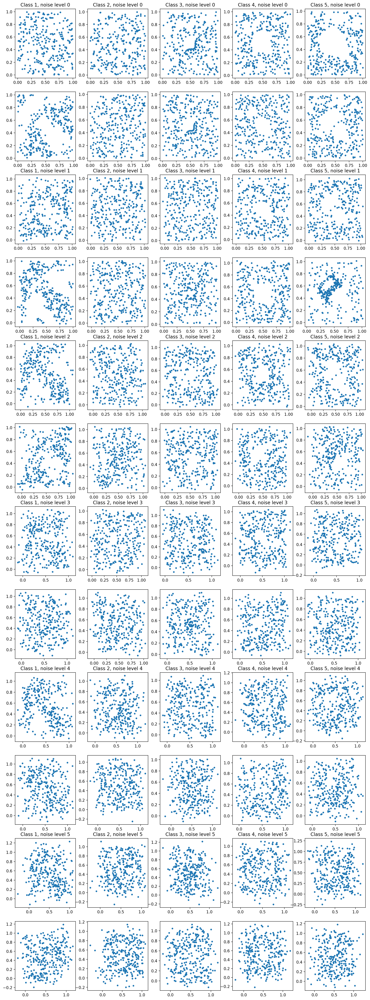

In [380]:
fig, ax = plt.subplots(12, 5, figsize=(16, 45), dpi=200)
for k in range(len(X_orbit5k_noisy)):
    for i in range(2):
        for j in range(5):
            if i==0:
                ax[2*k+i,j].set_title("Class {}, noise level {}".format(j+1, k))
            ax[2*k+i,j].scatter(X_orbit5k_noisy[k][j*1000+i,:,0], X_orbit5k_noisy[k][j*1000+i,:,1], s=10)

### At first we'll use the parameters that  with default dot product attention transformer

In [398]:
def plot_noise_pers(stats):
    
    mean_train, acc_train_ci1, acc_train_ci2, mean_test, acc_test_ci1, acc_test_ci2 = [], [], [], [], [], []
    
    for i, (_, stat) in enumerate(stats):
        
        mean_train.append(np.mean(stat[:, 0]))
        acc_train_ci1.append(mean_train[-1] - np.std(stat[:, 0]))
        acc_train_ci2.append(mean_train[-1] + np.std(stat[:, 0]))
        mean_test.append(np.mean(stat[:, 1]))
        acc_test_ci1.append(mean_test[-1] - np.std(stat[:, 1]))
        acc_test_ci2.append(mean_test[-1] + np.std(stat[:, 1]))
    
    plt.plot(noise_level, mean_train, label="train acc", c="r")
    plt.plot(noise_level, mean_test, label="test acc", c="b")
    plt.xlabel("Noise level")
    plt.ylabel("Accuracy")
    plt.fill_between(noise_level, acc_train_ci1, acc_train_ci2, color="r", alpha=0.1)
    plt.fill_between(noise_level, acc_test_ci1, acc_test_ci2, color="b", alpha=0.1)
    plt.legend()

In [506]:
def compute_noise_stability(noisy_data, model_cls, training_kwargs, model_kwargs, collate_fn, collate_kwargs):

    stats = []
    
    for k, _ in enumerate(noisy_data):
    
        X = []
        vr = ripser.Rips(maxdim=1)
        
        for x_pc in tqdm(noisy_data[k]):
            diagram = conv_pd(vr.fit_transform(x_pc))
            X.append(diagram)
    
        dataset = Orbit5kDataset(X, y)
    
        history = train_model(model_cls, dataset, **training_kwargs, 
                          model_kwargs=model_kwargs,
                          collate_fn=collate_fn, 
                          collate_kwargs=collate_kwargs)
    
        stats.append(history)

    return stats

In [388]:
training_kwargs = {"n_repeats": 5, 
                  "n_epochs": 50, 
                  "batch_size": 25,
                  "lr": 3e-4}

pers_transformer_kwargs = {"n_in": 3, 
                          "n_hidden_enc": 48, 
                          "n_out_enc": 24,
                          "n_head_enc": 4,
                          "dim_feed_enc": 48,
                          "activation": torch.nn.GELU,
                           "num_transformer_layers": 3
                          }

collate_kwargs = {"top_n": 10,}

noise_level = np.linspace(0, .1, 6)

stats = compute_noise_stability(X_orbit5k_noisy, 
                                PersTransformer,
                                training_kwargs=training_kwargs, 
                                model_kwargs=pers_transformer_kwargs,
                                collate_fn=top_n_by_group_collate_fn,
                                collate_kwargs=collate_kwargs)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


Epochs: 100%|██████████| 50/50 [04:03<00:00,  4.87s/it, Avg epoch loss=0.991, Accuracy train=0.607, Accuracy test=0.625]


Epochs: 100%|██████████| 50/50 [03:58<00:00,  4.77s/it, Avg epoch loss=0.997, Accuracy train=0.614, Accuracy test=0.593]


Epochs: 100%|██████████| 50/50 [04:03<00:00,  4.88s/it, Avg epoch loss=0.874, Accuracy train=0.661, Accuracy test=0.663]


Epochs: 100%|██████████| 50/50 [04:04<00:00,  4.90s/it, Avg epoch loss=0.863, Accuracy train=0.678, Accuracy test=0.702]


Epochs: 100%|██████████| 50/50 [04:00<00:00,  4.80s/it, Avg epoch loss=0.862, Accuracy train=0.676, Accuracy test=0.663]



Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


Epochs: 100%|██████████| 50/50 [04:03<00:00,  4.88s/it, Avg epoch loss=1.33, Accuracy train=0.4, Accuracy test=0.397]  


Epochs: 100%|██████████| 50/50 [04:11<00:00,  5.02s/it, Avg epoch loss=1.61, Accuracy train=0.32, Accuracy test=0.307] 


Epochs: 100%|██████████| 50/50 [04:03<00:00,  4.86s/it, Avg epoch loss=1.61, Accuracy train=0.203, Accuracy test=0.194]


Epochs: 100%|██████████| 50/50 [04:01<00:00,  4.83s/it, Avg epoch loss=1.21, Accuracy train=0.501, Accuracy test=0.497]


Epochs: 100%|██████████| 50/50 [04:03<00:00,  4.87s/it, Avg epoch loss=1.13, Accuracy train=0.543, Accuracy test=0.531]



Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


Epochs: 100%|██████████| 50/50 [04:09<00:00,  4.99s/it, Avg epoch loss=1.61, Accuracy train=0.214, Accuracy test=0.215]


Epochs: 100%|██████████| 50/50 [04:04<00:00,  4.88s/it, Avg epoch loss=1.61, Accuracy train=0.207, Accuracy test=0.185]


Epochs: 100%|██████████| 50/50 [04:10<00:00,  5.01s/it, Avg epoch loss=1.34, Accuracy train=0.403, Accuracy test=0.401]


Epochs: 100%|██████████| 50/50 [04:06<00:00,  4.93s/it, Avg epoch loss=1.61, Accuracy train=0.212, Accuracy test=0.172]


Epochs: 100%|██████████| 50/50 [04:06<00:00,  4.93s/it, Avg epoch loss=1.61, Accuracy train=0.207, Accuracy test=0.183]



Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


Epochs: 100%|██████████| 50/50 [04:08<00:00,  4.96s/it, Avg epoch loss=1.61, Accuracy train=0.208, Accuracy test=0.182]


Epochs: 100%|██████████| 50/50 [04:08<00:00,  4.96s/it, Avg epoch loss=1.61, Accuracy train=0.204, Accuracy test=0.19] 


Epochs: 100%|██████████| 50/50 [04:03<00:00,  4.87s/it, Avg epoch loss=1.61, Accuracy train=0.206, Accuracy test=0.187]


Epochs: 100%|██████████| 50/50 [04:09<00:00,  4.99s/it, Avg epoch loss=1.61, Accuracy train=0.209, Accuracy test=0.179]


Epochs: 100%|██████████| 50/50 [04:11<00:00,  5.03s/it, Avg epoch loss=1.61, Accuracy train=0.209, Accuracy test=0.18] 



Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


Epochs: 100%|██████████| 50/50 [04:11<00:00,  5.04s/it, Avg epoch loss=1.61, Accuracy train=0.204, Accuracy test=0.19] 


Epochs: 100%|██████████| 50/50 [04:08<00:00,  4.97s/it, Avg epoch loss=1.61, Accuracy train=0.203, Accuracy test=0.193]


Epochs: 100%|██████████| 50/50 [04:07<00:00,  4.95s/it, Avg epoch loss=1.61, Accuracy train=0.209, Accuracy test=0.178]


Epochs: 100%|██████████| 50/50 [04:09<00:00,  4.99s/it, Avg epoch loss=1.61, Accuracy train=0.206, Accuracy test=0.186]


Epochs: 100%|██████████| 50/50 [04:07<00:00,  4.95s/it, Avg epoch loss=1.61, Accuracy train=0.205, Accuracy test=0.189]



Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


Epochs: 100%|██████████| 50/50 [04:00<00:00,  4.81s/it, Avg epoch loss=1.61, Accuracy train=0.202, Accuracy test=0.195]


Epochs: 100%|██████████| 50/50 [04:13<00:00,  5.06s/it, Avg epoch loss=1.61, Accuracy train=0.202, Accuracy test=0.196]


Epochs: 100%|██████████| 50/50 [04:10<00:00,  5.01s/it, Avg epoch loss=1.61, Accuracy train=0.204, Accuracy test=0.191]


Epochs: 100%|██████████| 50/50 [04:09<00:00,  4.99s/it, Avg epoch loss=1.61, Accuracy train=0.203, Accuracy test=0.193]


Epochs: 100%|██████████| 50/50 [04:09<00:00,  4.99s/it, Avg epoch loss=1.61, Accuracy train=0.207, Accuracy test=0.183]

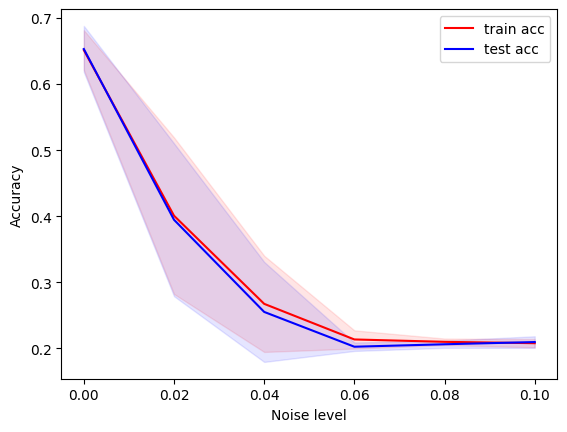

In [399]:
plot_noise_pers(stats)

### Let's try the same with different attention implementations

In [435]:
class L2MultiHeadAttention(torch.nn.Module):
    def __init__(self, num_heads, d_model, **kwargs):
        super(L2MultiHeadAttention, self).__init__()
        assert d_model % num_heads == 0
        self.num_heads = num_heads
        self.d_head = int(d_model / self.num_heads)
        # we only need two matrices as Q and K are tied for Lipschitzness
        self.w_q = torch.nn.Linear(d_model, d_model)
        self.w_v = torch.nn.Linear(d_model, d_model)
        self.w_out = torch.nn.Linear(d_model, d_model)

    def _reset_parameters(self):
        nn.init.xavier_uniform_(self.w_qkv.weight)
        self.w_qkv.bias.data.fill_(0)

        nn.init.xavier_uniform_(self.w_out.weight)
        self.w_out.bias.data.fill_(0)

    def forward(self, x, mask=None):
        # Project into query, key, and value space in one shot.
        q = self.w_q(x)
        # Split into different heads.
        q = einops.rearrange(q,
                               'batch seq_len (num_heads head_dim) -> batch num_heads seq_len head_dim',
                               num_heads=self.num_heads,
                               head_dim=self.d_head
                               )
        v = einops.rearrange(self.w_v.weight,
                               'd_model (num_heads head_dim) -> num_heads d_model head_dim',
                               num_heads=self.num_heads,
                               head_dim=self.d_head
                               )

        # Reshape so we can do dot product with query. -1 dimension of query vector needs to match -2 dimension of key.
        k = einops.rearrange(q,
                             'batch num_heads seq_len head_dim -> batch num_heads head_dim seq_len')

        W_q_T = einops.rearrange(self.w_q.weight, " d_model (num_heads head_dim) -> num_heads head_dim d_model", 
                                num_heads=self.num_heads,
                                head_dim=self.d_head
                                ) 
        
        # new regularized attention logits
        attention_logits = - (torch.sum(q**2, -1, keepdim=True) \
                              - 2*torch.matmul(q, k) + torch.sum(k**2, -2, keepdim=True)
                             ) / math.sqrt(q.size()[-1])
        if mask is not None:
            # Reshape so it work with the logits matrix
            mask = einops.rearrange(mask,
                                    'batch seq_len -> batch 1 1 seq_len')
            attention_logits = attention_logits.masked_fill(mask == 0, -9e15)
        attention_weights = torch.nn.functional.softmax(attention_logits, dim=-1)

        attention = attention_weights @ q @ W_q_T @ v / math.sqrt(q.size()[-1])
        # merge the heads.
        attention = einops.rearrange(attention,
                                     'batch num_heads seq_len head_dim -> batch seq_len (num_heads head_dim)')

        return x + self.w_out(attention)
                #attention_weights

In [436]:
def MLP(n_in: int, n_hidden: int, n_out: int, activation, dropout: int=.1):
    return torch.nn.Sequential(
        torch.nn.LayerNorm(n_in),
        torch.nn.Linear(n_in, n_hidden),
        activation(),
        torch.nn.Dropout(dropout),
        torch.nn.Linear(n_hidden, n_out)
    )

# MLP with residual connection
class ResMLP(torch.nn.Module):
    def __init__(self, n_in, n_hidden, n_out, activation, dropout=.1):
        super(ResMLP, self).__init__()
        self.mlp = MLP(n_in, n_hidden, n_out, activation, dropout)
    
    def forward(self, X):
        return X + self.mlp(X)

def AttentionBlock(num_heads: int, in_feats: int, feedforward_dim: int, activation, dropout=.1, 
                   attention_type=MultiHeadAttention, **kwargs):
    return torch.nn.Sequential(
        torch.nn.LayerNorm(in_feats),
        attention_type(num_heads=num_heads, d_model=in_feats, **kwargs),
        torch.nn.LayerNorm(in_feats),
        ResMLP(n_in=in_feats, n_hidden=feedforward_dim, n_out=in_feats, 
               activation=activation, dropout=dropout)
    )
    
class Encoder(torch.nn.Module):
    def __init__(self, n_in, n_hidden, n_out, n_head, feedforward_dim, activation, n_layers = 1,  dropout = .1, **kwargs):
        super(Encoder, self).__init__()
        self.embedder = torch.nn.Sequential(
             MLP(n_in=n_in, n_hidden=n_hidden, n_out=n_out, activation=activation, dropout=dropout,),
            *[AttentionBlock(num_heads=n_head, in_feats=n_out, feedforward_dim=feedforward_dim,
                          activation=activation, **kwargs) for _ in range(n_layers)],
            einops.layers.torch.Reduce("batch tokens features -> batch features", reduction="mean"),
        )
    def forward(self, X):
        return self.embedder(X)

class PersTransformer(torch.nn.Module):
    def __init__(self, n_in, n_hidden_enc, n_out_enc, n_head_enc, dim_feed_enc, activation, num_transformer_layers, 
                 n_hidden_dec=16, n_out_dec=5, dropout=.1, **kwargs):
        super(PersTransformer, self).__init__()
        self.encoder = Encoder(n_in, n_hidden_enc, n_out_enc, n_head_enc, dim_feed_enc, activation, 
                               num_transformer_layers, dropout, **kwargs)
        self.decoder = MLP(n_out_enc, n_hidden_dec, n_out_dec, activation)
        
    def forward(self, X):
        z_enc = self.encoder(X)
        z = self.decoder(z_enc)
        return z

In [561]:
pers_transformer_kwargs = {"n_in": 3, 
                          "n_hidden_enc": 96, 
                          "n_out_enc": 48,
                          "n_head_enc": 8,
                          "dim_feed_enc": 48,
                          "activation": torch.nn.GELU,
                           "num_transformer_layers": 3,
                           "attention_type": L2MultiHeadAttention,
                          }

In [562]:
training_kwargs = {"n_repeats": 5, 
                  "n_epochs": 50, 
                  "batch_size": 15,
                  "lr": 3e-4}

In [563]:
collate_kwargs = {"top_n": 10, }

In [564]:
model = PersTransformer(**pers_transformer_kwargs)

In [565]:
torchinfo.summary(model, (1, 300, 3),)

Layer (type:depth-idx)                             Output Shape              Param #
PersTransformer                                    [1, 5]                    --
├─Encoder: 1-1                                     [1, 48]                   --
│    └─Sequential: 2-1                             [1, 48]                   --
│    │    └─Sequential: 3-1                        [1, 300, 48]              5,046
│    │    └─Sequential: 3-2                        [1, 300, 48]              12,048
│    │    └─Sequential: 3-3                        [1, 300, 48]              12,048
│    │    └─Sequential: 3-4                        [1, 300, 48]              12,048
│    │    └─Reduce: 3-5                            [1, 48]                   --
├─Sequential: 1-2                                  [1, 5]                    --
│    └─LayerNorm: 2-2                              [1, 48]                   96
│    └─Linear: 2-3                                 [1, 16]                   784
│    └─GELU: 2-4   

In [566]:
%%time
history = train_model(PersTransformer, dataset, **training_kwargs, 
                      model_kwargs=pers_transformer_kwargs,
                      collate_fn=top_n_by_group_collate_fn, 
                      collate_kwargs=collate_kwargs)

Epochs: 100%|██████████| 50/50 [06:33<00:00,  7.87s/it, Avg epoch loss=0.85, Accuracy train=0.677, Accuracy test=0.684] 


Epochs: 100%|██████████| 50/50 [06:26<00:00,  7.72s/it, Avg epoch loss=0.841, Accuracy train=0.679, Accuracy test=0.673]


Epochs: 100%|██████████| 50/50 [06:14<00:00,  7.49s/it, Avg epoch loss=0.874, Accuracy train=0.67, Accuracy test=0.675] 


Epochs: 100%|██████████| 50/50 [06:42<00:00,  8.06s/it, Avg epoch loss=0.911, Accuracy train=0.649, Accuracy test=0.642]


Epochs: 100%|██████████| 50/50 [06:30<00:00,  7.81s/it, Avg epoch loss=0.852, Accuracy train=0.679, Accuracy test=0.659]


CPU times: user 32min 33s, sys: 1.23 s, total: 32min 34s
Wall time: 32min 27s


Mean train accuracy across 50 runs - 0.684, std - 0.003

Mean test accuracy across 50 runs - 0.679, std - 0.005
_______________________


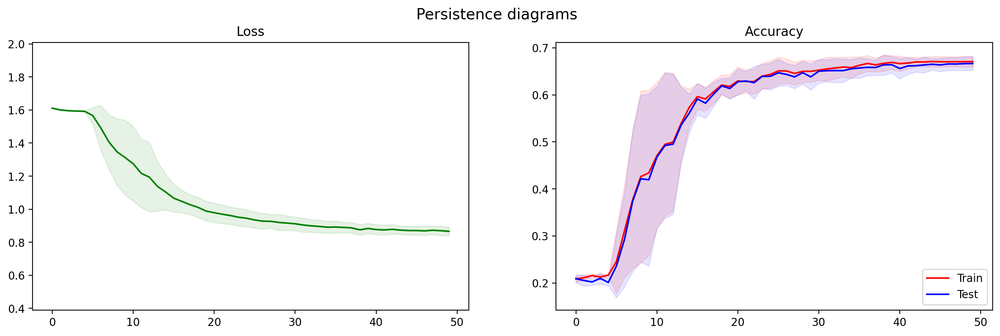

In [567]:
plot_training_stats(history, training_kwargs)

In [568]:
%%time
history = train_model(PersTransformer, dataset, **training_kwargs, 
                      model_kwargs=pers_transformer_kwargs,
                      collate_fn=top_n_sample_by_group_collate_fn, 
                      collate_kwargs=collate_kwargs)

Epochs: 100%|██████████| 50/50 [08:06<00:00,  9.72s/it, Avg epoch loss=1.15, Accuracy train=0.535, Accuracy test=0.527]


Epochs: 100%|██████████| 50/50 [08:18<00:00,  9.97s/it, Avg epoch loss=1.16, Accuracy train=0.545, Accuracy test=0.524]


Epochs: 100%|██████████| 50/50 [08:09<00:00,  9.80s/it, Avg epoch loss=1.19, Accuracy train=0.53, Accuracy test=0.523] 


Epochs: 100%|██████████| 50/50 [08:01<00:00,  9.62s/it, Avg epoch loss=1.12, Accuracy train=0.546, Accuracy test=0.535]


Epochs: 100%|██████████| 50/50 [08:10<00:00,  9.82s/it, Avg epoch loss=1.15, Accuracy train=0.534, Accuracy test=0.525]


CPU times: user 40min 56s, sys: 1.39 s, total: 40min 57s
Wall time: 40min 46s


Mean train accuracy across 50 runs - 0.550, std - 0.000

Mean test accuracy across 50 runs - 0.544, std - 0.008
_______________________


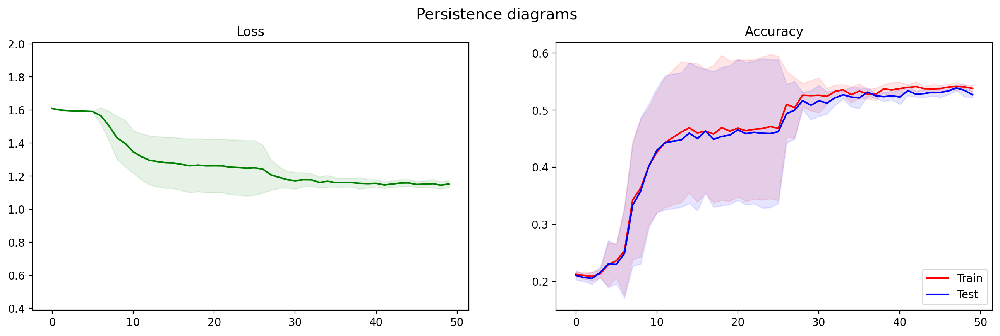

In [569]:
plot_training_stats(history, training_kwargs)

Taking too little features also doesn't benefit -- overall, number of persistent features to take ends up being a highly data dependent hyperparameter

In [570]:
collate_kwargs={"top_n": 5}

In [571]:
%%time
history = train_model(PersTransformer, dataset, **training_kwargs, 
                      model_kwargs=pers_transformer_kwargs,
                      collate_fn=top_n_sample_by_group_collate_fn, 
                      collate_kwargs=collate_kwargs)

Epochs: 100%|██████████| 50/50 [08:07<00:00,  9.75s/it, Avg epoch loss=1.33, Accuracy train=0.429, Accuracy test=0.399]


Epochs: 100%|██████████| 50/50 [08:22<00:00, 10.06s/it, Avg epoch loss=1.33, Accuracy train=0.416, Accuracy test=0.405]


Epochs: 100%|██████████| 50/50 [08:04<00:00,  9.69s/it, Avg epoch loss=1.34, Accuracy train=0.424, Accuracy test=0.421]


Epochs: 100%|██████████| 50/50 [07:58<00:00,  9.56s/it, Avg epoch loss=1.33, Accuracy train=0.43, Accuracy test=0.399] 


Epochs: 100%|██████████| 50/50 [08:04<00:00,  9.70s/it, Avg epoch loss=1.34, Accuracy train=0.43, Accuracy test=0.379] 


CPU times: user 40min 41s, sys: 3.05 s, total: 40min 44s
Wall time: 40min 37s


Mean train accuracy across 50 runs - 0.426, std - 0.004

Mean test accuracy across 50 runs - 0.429, std - 0.004
_______________________


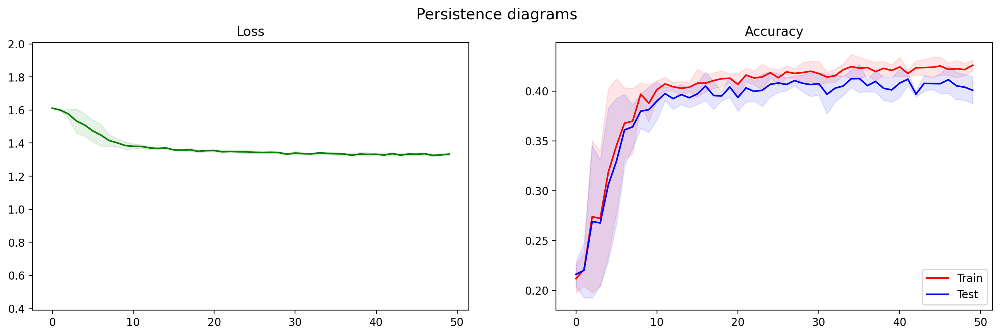

In [572]:
plot_training_stats(history, training_kwargs)

Noise stability

In [521]:
training_kwargs = {"n_repeats": 5, 
                  "n_epochs": 50, 
                  "batch_size": 25,
                  "lr": 3e-4}

pers_transformer_kwargs = {"n_in": 3, 
                          "n_hidden_enc": 96, 
                          "n_out_enc": 48,
                          "n_head_enc": 8,
                          "dim_feed_enc": 48,
                          "activation": torch.nn.GELU,
                           "num_transformer_layers": 5,
                           "attention_type": L2MultiHeadAttention,
                          }

collate_kwargs = {"top_n": 15,}

noise_level = np.linspace(0, .1, 6)

stats = compute_noise_stability(X_orbit5k_noisy, 
                                PersTransformer,
                                training_kwargs=training_kwargs, 
                                model_kwargs=pers_transformer_kwargs,
                                collate_fn=top_n_by_group_collate_fn,
                                collate_kwargs=collate_kwargs)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


Epochs: 100%|██████████| 50/50 [05:46<00:00,  6.94s/it, Avg epoch loss=1.13, Accuracy train=0.537, Accuracy test=0.545]


Epochs: 100%|██████████| 50/50 [05:49<00:00,  6.99s/it, Avg epoch loss=0.86, Accuracy train=0.688, Accuracy test=0.68]  


Epochs: 100%|██████████| 50/50 [05:44<00:00,  6.89s/it, Avg epoch loss=0.943, Accuracy train=0.655, Accuracy test=0.636]


Epochs: 100%|██████████| 50/50 [05:50<00:00,  7.01s/it, Avg epoch loss=0.88, Accuracy train=0.677, Accuracy test=0.682] 


Epochs: 100%|██████████| 50/50 [05:50<00:00,  7.00s/it, Avg epoch loss=0.894, Accuracy train=0.678, Accuracy test=0.673]



Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


Epochs: 100%|██████████| 50/50 [05:53<00:00,  7.08s/it, Avg epoch loss=1.61, Accuracy train=0.205, Accuracy test=0.189]


Epochs: 100%|██████████| 50/50 [05:52<00:00,  7.05s/it, Avg epoch loss=1.61, Accuracy train=0.205, Accuracy test=0.189]


Epochs: 100%|██████████| 50/50 [05:52<00:00,  7.05s/it, Avg epoch loss=1.61, Accuracy train=0.205, Accuracy test=0.189]


Epochs: 100%|██████████| 50/50 [05:50<00:00,  7.00s/it, Avg epoch loss=1.61, Accuracy train=0.221, Accuracy test=0.213]


Epochs: 100%|██████████| 50/50 [05:52<00:00,  7.06s/it, Avg epoch loss=1.61, Accuracy train=0.203, Accuracy test=0.193]



Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


Epochs: 100%|██████████| 50/50 [05:55<00:00,  7.11s/it, Avg epoch loss=1.61, Accuracy train=0.204, Accuracy test=0.19] 


Epochs: 100%|██████████| 50/50 [05:55<00:00,  7.10s/it, Avg epoch loss=1.61, Accuracy train=0.206, Accuracy test=0.186]


Epochs: 100%|██████████| 50/50 [05:50<00:00,  7.01s/it, Avg epoch loss=1.61, Accuracy train=0.206, Accuracy test=0.185]


Epochs: 100%|██████████| 50/50 [05:55<00:00,  7.10s/it, Avg epoch loss=1.61, Accuracy train=0.206, Accuracy test=0.186]


Epochs: 100%|██████████| 50/50 [05:55<00:00,  7.11s/it, Avg epoch loss=1.61, Accuracy train=0.208, Accuracy test=0.181]



Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


Epochs: 100%|██████████| 50/50 [05:51<00:00,  7.02s/it, Avg epoch loss=1.61, Accuracy train=0.203, Accuracy test=0.194]


Epochs: 100%|██████████| 50/50 [05:55<00:00,  7.10s/it, Avg epoch loss=1.61, Accuracy train=0.206, Accuracy test=0.185]


Epochs: 100%|██████████| 50/50 [05:53<00:00,  7.06s/it, Avg epoch loss=1.61, Accuracy train=0.204, Accuracy test=0.19] 


Epochs: 100%|██████████| 50/50 [05:53<00:00,  7.07s/it, Avg epoch loss=1.61, Accuracy train=0.207, Accuracy test=0.183]


Epochs: 100%|██████████| 50/50 [05:53<00:00,  7.06s/it, Avg epoch loss=1.61, Accuracy train=0.205, Accuracy test=0.189]



Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


Epochs: 100%|██████████| 50/50 [05:51<00:00,  7.03s/it, Avg epoch loss=1.61, Accuracy train=0.205, Accuracy test=0.189]


Epochs: 100%|██████████| 50/50 [05:56<00:00,  7.13s/it, Avg epoch loss=1.61, Accuracy train=0.203, Accuracy test=0.194]


Epochs: 100%|██████████| 50/50 [05:52<00:00,  7.05s/it, Avg epoch loss=1.61, Accuracy train=0.207, Accuracy test=0.183]


Epochs: 100%|██████████| 50/50 [05:52<00:00,  7.05s/it, Avg epoch loss=1.61, Accuracy train=0.204, Accuracy test=0.191]


Epochs: 100%|██████████| 50/50 [05:54<00:00,  7.08s/it, Avg epoch loss=1.61, Accuracy train=0.205, Accuracy test=0.188]



Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


Epochs: 100%|██████████| 50/50 [05:53<00:00,  7.07s/it, Avg epoch loss=1.61, Accuracy train=0.206, Accuracy test=0.185]


Epochs: 100%|██████████| 50/50 [05:53<00:00,  7.07s/it, Avg epoch loss=1.61, Accuracy train=0.206, Accuracy test=0.187]


Epochs: 100%|██████████| 50/50 [05:55<00:00,  7.10s/it, Avg epoch loss=1.61, Accuracy train=0.207, Accuracy test=0.183]


Epochs: 100%|██████████| 50/50 [05:52<00:00,  7.06s/it, Avg epoch loss=1.61, Accuracy train=0.203, Accuracy test=0.192]


Epochs: 100%|██████████| 50/50 [05:52<00:00,  7.05s/it, Avg epoch loss=1.61, Accuracy train=0.203, Accuracy test=0.193]

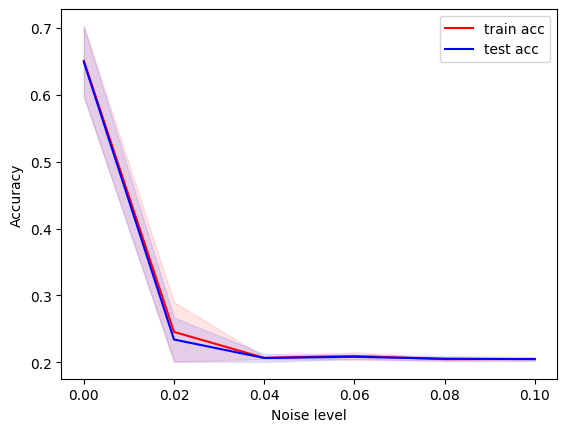

In [522]:
plot_noise_pers(stats)

Overall, Lipschitzness ensures higher stability during training as expected and even higher generalization. However, current implementation is not optimal, so training takes longer.

In [622]:
class KNNMultiHeadAttention(torch.nn.Module):
    def __init__(self, num_heads, d_model, top_k: int):
        super(KNNMultiHeadAttention, self).__init__()
        assert d_model % num_heads == 0
        self.num_heads = num_heads
        self.top_k = top_k
        self.d_head = int(d_model / self.num_heads)
        self.w_qkv = torch.nn.Linear(d_model, 3 * d_model)
        self.w_out = torch.nn.Linear(d_model, d_model)
        

    def _reset_parameters(self):
        nn.init.xavier_uniform_(self.w_qkv.weight)
        self.w_qkv.bias.data.fill_(0)

        nn.init.xavier_uniform_(self.w_out.weight)
        self.w_out.bias.data.fill_(0)

    def forward(self, x, mask=None):
        # Project into query, key, and value space in one shot.
        qkv = self.w_qkv(x)
        # Split into different heads.
        qkv = einops.rearrange(qkv,
                               'batch seq_len (num_heads head_dim) -> batch num_heads seq_len head_dim',
                               num_heads=self.num_heads,
                               head_dim=3 * self.d_head
                               )

        # For each head split back into query, key, and value.
        q, k, v = einops.rearrange(qkv,
                                   'batch num_heads seq_len (split head_dim) -> split batch num_heads seq_len head_dim',
                                   split=3)

        # Reshape so we can do dot product with query. -1 dimension of query vector needs to match -2 dimension of key.
        k = einops.rearrange(k,
                             'batch num_heads seq_len head_dim -> batch num_heads head_dim seq_len')

        attention_logits = torch.matmul(q, k) / math.sqrt(q.size()[-1])

        knn_mask = torch.zeros(k.size()[0], self.num_heads, k.size()[-1], k.size()[-1], device=x.device, requires_grad=False)
        # get indices of top_k values along the row axis
        index = torch.topk(attention_logits, k=self.top_k, dim=-1, largest=True, sorted=False)[1]
        # fill the mask with ones at given index positions (like self.weights[i][j][k][index[i][j][k][l]] = 1.
        knn_mask.scatter_(-1, index, 1.)
        # fill dropped positions with -inf much like in masked attention
        attention_logits=torch.where(knn_mask>0, attention_logits, torch.full_like(attention_logits, float("-inf")))
        if mask is not None:
            # Reshape so it work with the logits matrix
            mask = einops.rearrange(mask,
                                    'batch seq_len -> batch 1 1 seq_len')
            attention_logits = attention_logits.masked_fill(mask == 0, -9e15)
        attention_weights = torch.nn.functional.softmax(attention_logits, dim=-1)

        attention = torch.matmul(attention_weights, v)
        # merge the heads.
        attention = einops.rearrange(attention,
                                     'batch num_heads seq_len head_dim -> batch seq_len (num_heads head_dim)')

        return x + self.w_out(attention)
                #attention_weights

Now we can define more features to obtain from PersDiag, but limit the number used in KNN

In [658]:
pers_transformer_kwargs = {"n_in": 3, 
                          "n_hidden_enc": 96, 
                          "n_out_enc": 48,
                          "n_head_enc": 8,
                          "dim_feed_enc": 48,
                          "activation": torch.nn.LeakyReLU,
                           "num_transformer_layers": 3,
                           "attention_type": KNNMultiHeadAttention,
                           "top_k": 25,
                          }

In [659]:
training_kwargs = {"n_repeats": 5, 
                  "n_epochs": 50, 
                  "batch_size": 40,
                  "lr": 3e-4}

In [660]:
collate_kwargs = {"top_n": 15, }

In [661]:
model = PersTransformer(**pers_transformer_kwargs)

In [662]:
torchinfo.summary(model, (1, 300, 3),)

Layer (type:depth-idx)                             Output Shape              Param #
PersTransformer                                    [1, 5]                    --
├─Encoder: 1-1                                     [1, 48]                   --
│    └─Sequential: 2-1                             [1, 48]                   --
│    │    └─Sequential: 3-1                        [1, 300, 48]              5,046
│    │    └─Sequential: 3-2                        [1, 300, 48]              14,400
│    │    └─Sequential: 3-3                        [1, 300, 48]              14,400
│    │    └─Sequential: 3-4                        [1, 300, 48]              14,400
│    │    └─Reduce: 3-5                            [1, 48]                   --
├─Sequential: 1-2                                  [1, 5]                    --
│    └─LayerNorm: 2-2                              [1, 48]                   96
│    └─Linear: 2-3                                 [1, 16]                   784
│    └─LeakyReLU: 2

In [663]:
%%time
history = train_model(PersTransformer, dataset, **training_kwargs, 
                      model_kwargs=pers_transformer_kwargs,
                      collate_fn=top_n_by_group_collate_fn, 
                      collate_kwargs=collate_kwargs)

Epochs: 100%|██████████| 50/50 [03:30<00:00,  4.20s/it, Avg epoch loss=1.59, Accuracy train=0.215, Accuracy test=0.201]


Epochs: 100%|██████████| 50/50 [03:29<00:00,  4.20s/it, Avg epoch loss=1.59, Accuracy train=0.224, Accuracy test=0.19] 


Epochs: 100%|██████████| 50/50 [03:30<00:00,  4.21s/it, Avg epoch loss=0.835, Accuracy train=0.659, Accuracy test=0.641]


Epochs: 100%|██████████| 50/50 [03:31<00:00,  4.23s/it, Avg epoch loss=1.59, Accuracy train=0.215, Accuracy test=0.202]


Epochs: 100%|██████████| 50/50 [03:29<00:00,  4.18s/it, Avg epoch loss=1.59, Accuracy train=0.215, Accuracy test=0.21] 


CPU times: user 17min 34s, sys: 1.2 s, total: 17min 35s
Wall time: 17min 31s


Mean train accuracy across 50 runs - 0.312, std - 0.011

Mean test accuracy across 50 runs - 0.299, std - 0.004
_______________________


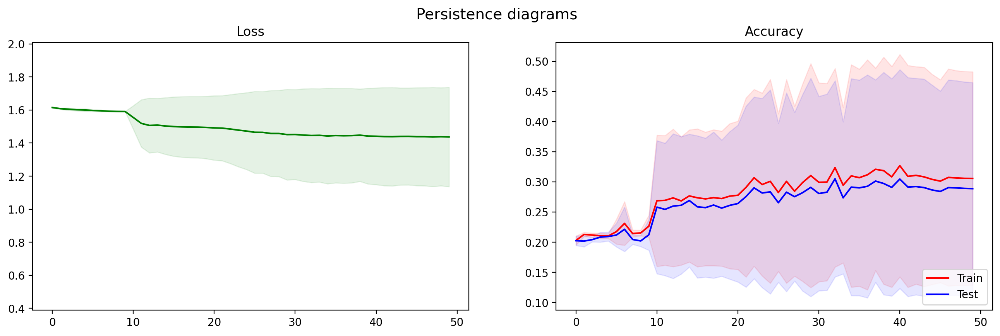

In [665]:
plot_training_stats(history, training_kwargs)

In [666]:
pers_transformer_kwargs = {"n_in": 3, 
                          "n_hidden_enc": 96, 
                          "n_out_enc": 48,
                          "n_head_enc": 8,
                          "dim_feed_enc": 48,
                          "activation": torch.nn.LeakyReLU,
                           "num_transformer_layers": 3,
                           "attention_type": KNNMultiHeadAttention,
                           "top_k": 30,
                          }

In [667]:
%%time
history = train_model(PersTransformer, dataset, **training_kwargs, 
                      model_kwargs=pers_transformer_kwargs,
                      collate_fn=top_n_sample_by_group_collate_fn, 
                      collate_kwargs=collate_kwargs)

Epochs: 100%|██████████| 50/50 [05:16<00:00,  6.34s/it, Avg epoch loss=1.58, Accuracy train=0.218, Accuracy test=0.207]


Epochs: 100%|██████████| 50/50 [05:12<00:00,  6.25s/it, Avg epoch loss=1.58, Accuracy train=0.22, Accuracy test=0.221] 


Epochs: 100%|██████████| 50/50 [05:18<00:00,  6.36s/it, Avg epoch loss=1.59, Accuracy train=0.232, Accuracy test=0.202]


Epochs: 100%|██████████| 50/50 [05:28<00:00,  6.57s/it, Avg epoch loss=1.08, Accuracy train=0.582, Accuracy test=0.567]


Epochs: 100%|██████████| 50/50 [05:28<00:00,  6.57s/it, Avg epoch loss=1.58, Accuracy train=0.225, Accuracy test=0.182]


CPU times: user 26min 50s, sys: 1.6 s, total: 26min 51s
Wall time: 26min 44s


Mean train accuracy across 50 runs - 0.214, std - 0.007

Mean test accuracy across 50 runs - 0.228, std - 0.002
_______________________


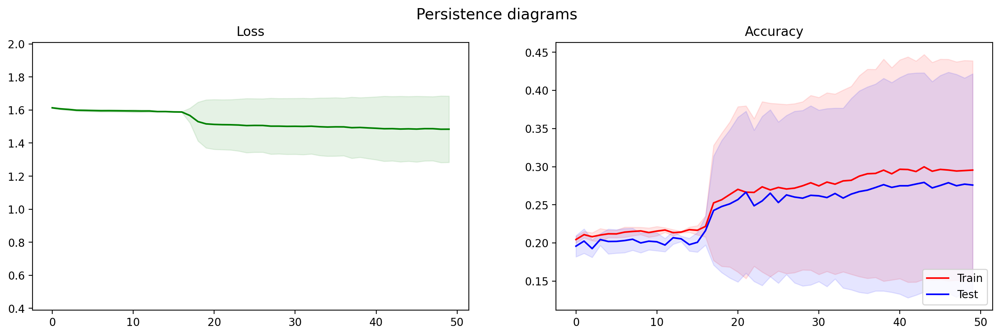

In [668]:
plot_training_stats(history, training_kwargs)

In [674]:
pers_transformer_kwargs = {"n_in": 3, 
                          "n_hidden_enc": 96, 
                          "n_out_enc": 48,
                          "n_head_enc": 8,
                          "dim_feed_enc": 48,
                          "activation": torch.nn.GELU,
                           "num_transformer_layers": 3,
                           "attention_type": KNNMultiHeadAttention,
                           "top_k": 7,
                          }

collate_kwargs={"top_n": 40}

In [677]:
%%time
history = train_model(PersTransformer, dataset, **training_kwargs, 
                      model_kwargs=pers_transformer_kwargs,
                      collate_fn=top_n_by_group_collate_fn, 
                      collate_kwargs=collate_kwargs)

Epochs: 100%|██████████| 50/50 [06:39<00:00,  7.99s/it, Avg epoch loss=1.04, Accuracy train=0.543, Accuracy test=0.495]


Epochs: 100%|██████████| 50/50 [06:36<00:00,  7.93s/it, Avg epoch loss=1.58, Accuracy train=0.219, Accuracy test=0.201]


Epochs: 100%|██████████| 50/50 [06:40<00:00,  8.02s/it, Avg epoch loss=1.58, Accuracy train=0.218, Accuracy test=0.197]


Epochs: 100%|██████████| 50/50 [06:36<00:00,  7.94s/it, Avg epoch loss=1.58, Accuracy train=0.214, Accuracy test=0.199]


Epochs: 100%|██████████| 50/50 [06:33<00:00,  7.88s/it, Avg epoch loss=1.18, Accuracy train=0.482, Accuracy test=0.478]


CPU times: user 33min 18s, sys: 711 ms, total: 33min 19s
Wall time: 33min 8s


Mean train accuracy across 50 runs - 0.544, std - 0.021

Mean test accuracy across 50 runs - 0.220, std - 0.002
_______________________


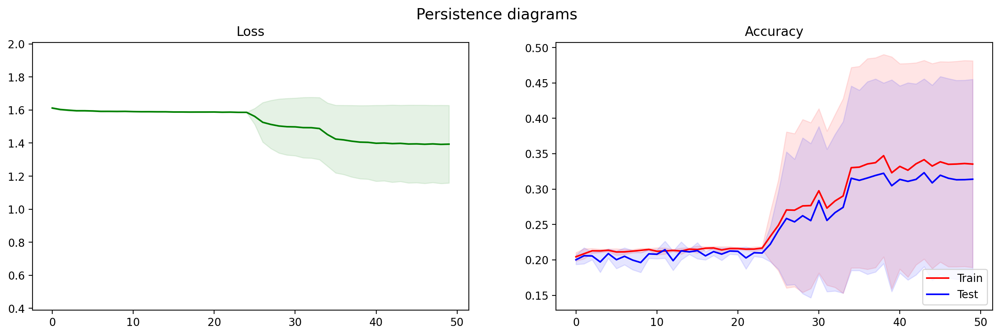

In [678]:
plot_training_stats(history, training_kwargs)

In [679]:
%%time
history = train_model(PersTransformer, dataset, **training_kwargs, 
                      model_kwargs=pers_transformer_kwargs,
                      collate_fn=top_n_sample_by_group_collate_fn, 
                      collate_kwargs=collate_kwargs)

Epochs: 100%|██████████| 50/50 [08:37<00:00, 10.35s/it, Avg epoch loss=1.58, Accuracy train=0.257, Accuracy test=0.245]


Epochs: 100%|██████████| 50/50 [08:37<00:00, 10.35s/it, Avg epoch loss=1.58, Accuracy train=0.243, Accuracy test=0.237]


Epochs: 100%|██████████| 50/50 [08:34<00:00, 10.29s/it, Avg epoch loss=1.14, Accuracy train=0.503, Accuracy test=0.505]


Epochs: 100%|██████████| 50/50 [08:32<00:00, 10.25s/it, Avg epoch loss=0.994, Accuracy train=0.575, Accuracy test=0.567]


Epochs: 100%|██████████| 50/50 [08:34<00:00, 10.29s/it, Avg epoch loss=1.16, Accuracy train=0.417, Accuracy test=0.413]


CPU times: user 43min 13s, sys: 553 ms, total: 43min 14s
Wall time: 42min 57s


Mean train accuracy across 50 runs - 0.258, std - 0.004

Mean test accuracy across 50 runs - 0.254, std - 0.004
_______________________


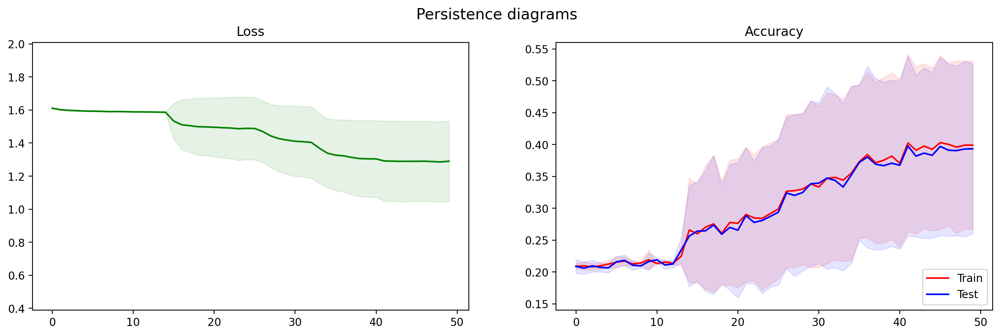

In [680]:
plot_training_stats(history, training_kwargs)

In [681]:
pers_transformer_kwargs = {"n_in": 3, 
                          "n_hidden_enc": 96, 
                          "n_out_enc": 48,
                          "n_head_enc": 8,
                          "dim_feed_enc": 48,
                          "activation": torch.nn.GELU,
                           "num_transformer_layers": 3,
                           "attention_type": KNNMultiHeadAttention,
                           "top_k": 5,
                          }

collate_kwargs={"top_n": 25}

In [682]:
%%time
history = train_model(PersTransformer, dataset, **training_kwargs, 
                      model_kwargs=pers_transformer_kwargs,
                      collate_fn=top_n_by_group_collate_fn, 
                      collate_kwargs=collate_kwargs)

Epochs: 100%|██████████| 50/50 [04:09<00:00,  4.99s/it, Avg epoch loss=0.843, Accuracy train=0.64, Accuracy test=0.633] 


Epochs: 100%|██████████| 50/50 [04:10<00:00,  5.02s/it, Avg epoch loss=1.59, Accuracy train=0.215, Accuracy test=0.205]


Epochs: 100%|██████████| 50/50 [04:10<00:00,  5.01s/it, Avg epoch loss=1.13, Accuracy train=0.519, Accuracy test=0.499]


Epochs: 100%|██████████| 50/50 [04:09<00:00,  4.99s/it, Avg epoch loss=1.58, Accuracy train=0.219, Accuracy test=0.2]  


Epochs: 100%|██████████| 50/50 [04:10<00:00,  5.00s/it, Avg epoch loss=1.03, Accuracy train=0.525, Accuracy test=0.533]


CPU times: user 20min 57s, sys: 546 ms, total: 20min 58s
Wall time: 20min 50s


Mean train accuracy across 50 runs - 0.656, std - 0.012

Mean test accuracy across 50 runs - 0.221, std - 0.005
_______________________


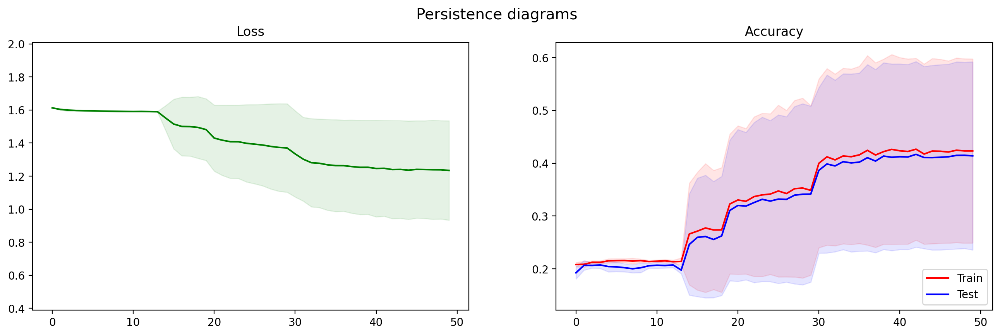

In [683]:
plot_training_stats(history, training_kwargs)

### Interestingly, KNNAttention fails to achieve the same level of accuracy 

### Notes

- each task can be graded with zero, half or full amount of point depending on the completeness of the solution and reporting,
- you can earn additional points by solving seminar problems.